In [1]:
# Import libraries
import warnings
warnings.filterwarnings("ignore")

from typing import Dict


import matplotlib.pyplot as plt
import numpy as np
import sys
import os

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '../src/bmi/benchmark')))
from synthetic_tasks.synthetic import task_synthetic
from utils.utils_synthetic import plot_2d_figure, plot_3d_figure, update_cell_bounds, plot_swissroll, plot_spiral

from synthetic_tasks.half_cube import transform_half_cube_task as half_cube
from synthetic_tasks.asinh import transform_asinh_task as asinh
from synthetic_tasks.normal_cdf import transform_normal_cdf_task as uniform_margins

from synthetic_tasks.inverted_gaussian_cdf import transform_gaussian_cdf_task as gaussian_cdf
from synthetic_tasks.inverted_tstudent_cdf import transform_student_cdf_task as student_cdf

from synthetic_tasks.wiggly import transform_wiggly_task as wiggly
from synthetic_tasks.embeddings import transform_swissroll_task as swissroll
from synthetic_tasks.spiral import transform_spiral_task as spiral

## 2 dimensional x 2 symbols 

In [2]:
# Initialize an empty numpy array with 2 elements to store cell boundaries
singular_2d_bounds: np.ndarray = np.empty(shape=2, dtype="object")

# Assign boundaries for the 2D scenario
singular_2d_bounds[:] = [np.array([-1.0, 0.0, 1.0]), np.array([-1.0, 0.0, 1.0])]

# Create a dictionary to define the scenario for the synthetic distribution
singular_2d_scenario: Dict[str, np.ndarray] = {
    # Probabilities for each symbol
    "sym_prob": np.array([0.5, 0.5]),
    # Cell boundaries in the 2D space
    "cell_bound": singular_2d_bounds,
    # Probabilities for each cell in the 2D grid, structured as 2x2 matrices
    "cell_prob": np.array([[[0.5, 0.0], [0.0, 0.5]], [[0.0, 0.5], [0.5, 0.0]]])
    }

### Base case

entropy_y : 1.0
in_shape : [2]
num_classes : 2
max_acc1 : 1.0
total_params : 16
mi_1 : 0.0
mi_2 : 0.0
mi_1-2 : 1.0
joint_mi : 1.0


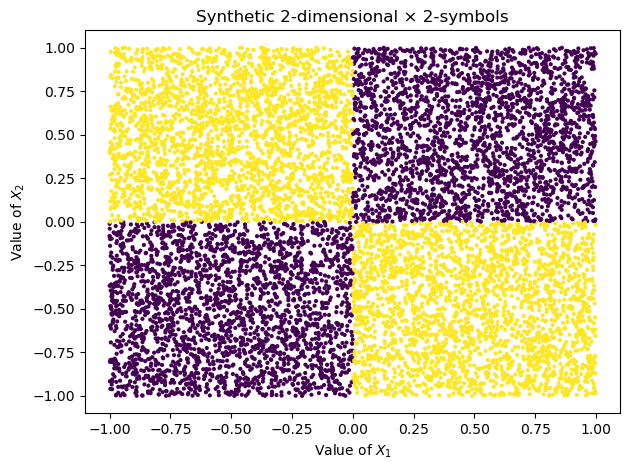

In [3]:
# Number of samples
n_samples = 10_000
# Seed for random number generator 
SEED = 1234

# Create a synthetic distribution object
synthetic_dist_singular_2d = task_synthetic(
   cell_boundaries=singular_2d_scenario['cell_bound'],
   symbol_probabilities=singular_2d_scenario['sym_prob'],
   cell_probabilities=singular_2d_scenario['cell_prob']
   )
# Print elements of the metadata
for element in synthetic_dist_singular_2d.sampler.get_metadata().items():
   print(f"{element[0]} : {element[1]}")
    
# Sample 'n_samples' data points from the synthetic distribution 
x_sample, y_sample = synthetic_dist_singular_2d.sample(n_samples=n_samples, seed=SEED)
# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=x_sample,
   y=y_sample, 
   cell_boundaries=singular_2d_scenario['cell_bound'], 
   title=synthetic_dist_singular_2d.name,
   plot_cells=False
   )

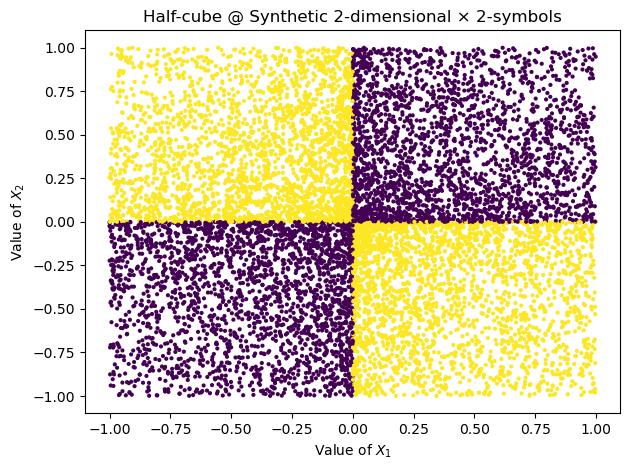

In [4]:
# Apply half-cube mapping
half_cube_map = half_cube(base_task=synthetic_dist_singular_2d)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=half_cube_x_sample, scenario=singular_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=half_cube_map.name,
   plot_cells=False
   )

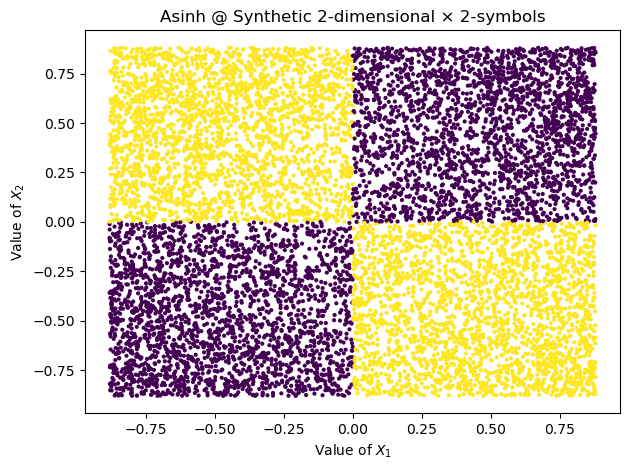

In [5]:
# Apply asinh mapping 
asinh_map = asinh(base_task=synthetic_dist_singular_2d)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=asinh_x_sample, scenario=singular_2d_scenario)
# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=asinh_map.name,
   plot_cells=False
   )

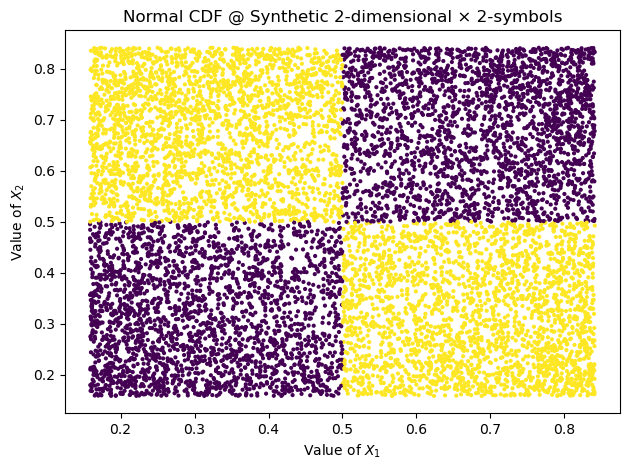

In [6]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(base_task=synthetic_dist_singular_2d)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=uniform_x_sample, scenario=singular_2d_scenario)
# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=uniform_margins_map.name,
   plot_cells=False
   )

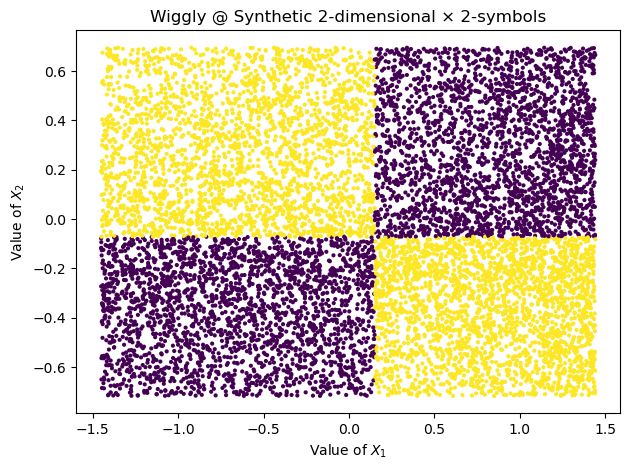

In [7]:
# Apply wiggly transformation
wiggly_map = wiggly(base_task=synthetic_dist_singular_2d)
wiggly_x_sample, wiggly_y_sample = wiggly_map.sampler.sample_split(n_points=n_samples, rng=SEED, transformer="wiggly")

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=wiggly_x_sample, scenario=singular_2d_scenario)
# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=wiggly_x_sample,
   y=wiggly_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=wiggly_map.name,
   plot_cells=False
   )

Total dimensions: 4


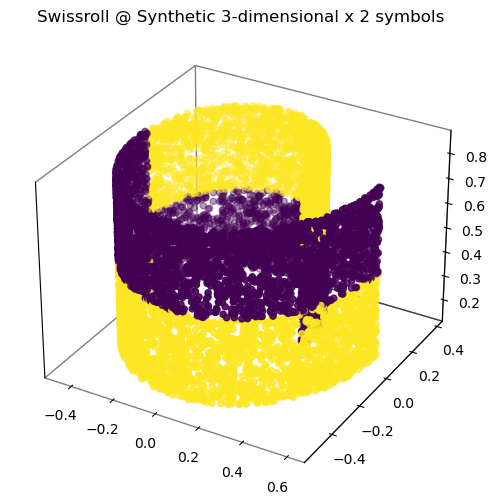

In [8]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(base_task=uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=singular_2d_scenario,
   x_swiss=X_swiss,  
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )


### Gaussian transformed

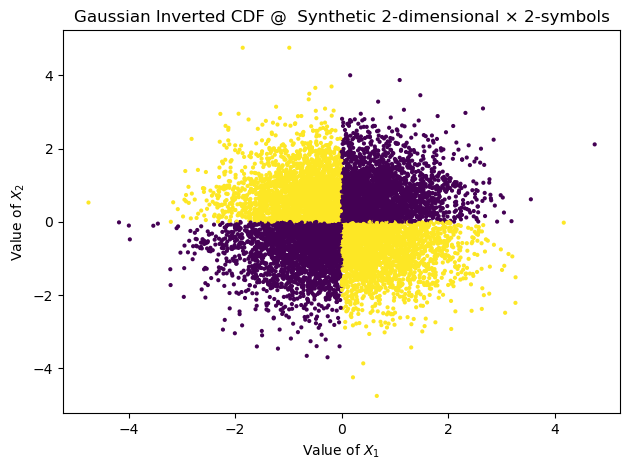

In [9]:
gaussian_cdf_transf = gaussian_cdf(base_task=synthetic_dist_singular_2d)
gaussian_x_sample, gaussian_y_sample = gaussian_cdf_transf.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=gaussian_x_sample, scenario=singular_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
    X=gaussian_x_sample,                  
    y=gaussian_y_sample,                  
    cell_boundaries=new_cell_bound,       
    title=gaussian_cdf_transf.name,       
    plot_cells=False                      
)

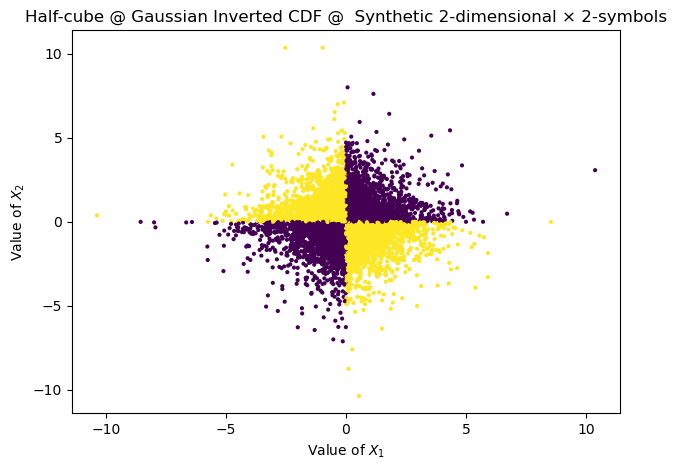

In [10]:
# Apply half-cube mapping
half_cube_map = half_cube(base_task=gaussian_cdf_transf)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=half_cube_x_sample, scenario=singular_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=half_cube_map.name,
   plot_cells=False
   )

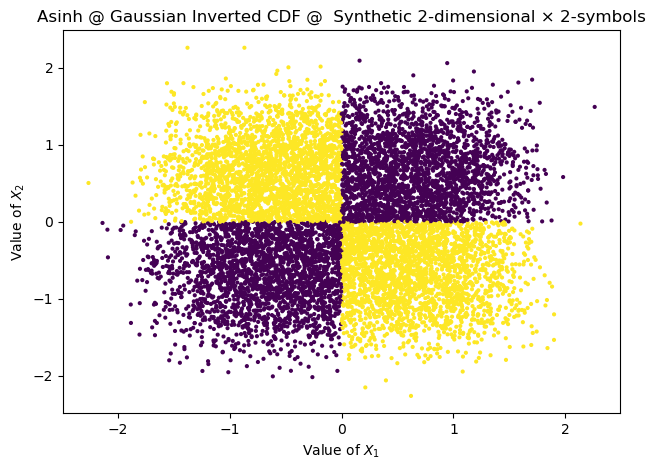

In [11]:
# Apply asinh mapping 
asinh_map = asinh(base_task=gaussian_cdf_transf)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=asinh_x_sample, scenario=singular_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=asinh_map.name,
   plot_cells=False
   )

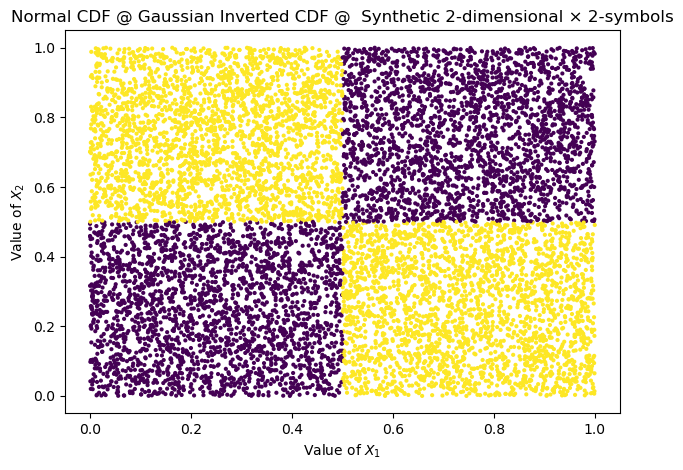

In [12]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(base_task=gaussian_cdf_transf)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=uniform_x_sample, scenario=singular_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=uniform_margins_map.name,
   plot_cells=False
   )

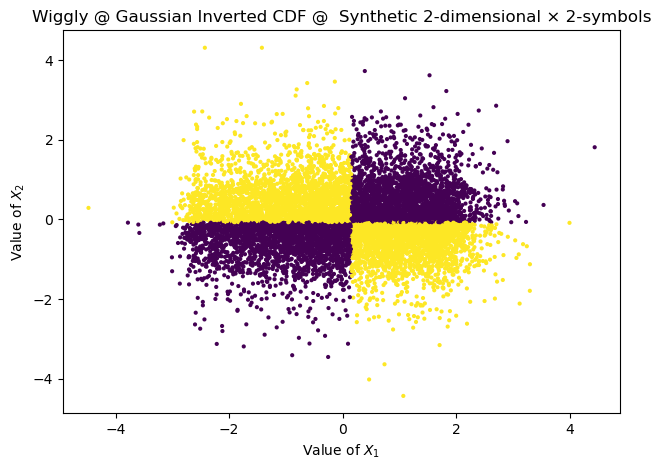

In [13]:
# Apply wiggly transformation
wiggly_map = wiggly(base_task=gaussian_cdf_transf)
wiggly_x_sample, wiggly_y_sample = wiggly_map.sampler.sample_split(n_points=n_samples, rng=SEED, transformer="wiggly")

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=wiggly_x_sample, scenario=singular_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=wiggly_x_sample,
   y=wiggly_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=wiggly_map.name,
   plot_cells=False
   )

Total dimensions: 4


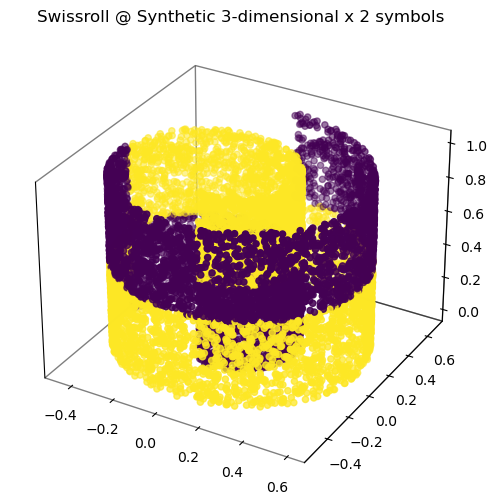

In [16]:

# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(base_task=uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=singular_2d_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

### t-student transformed

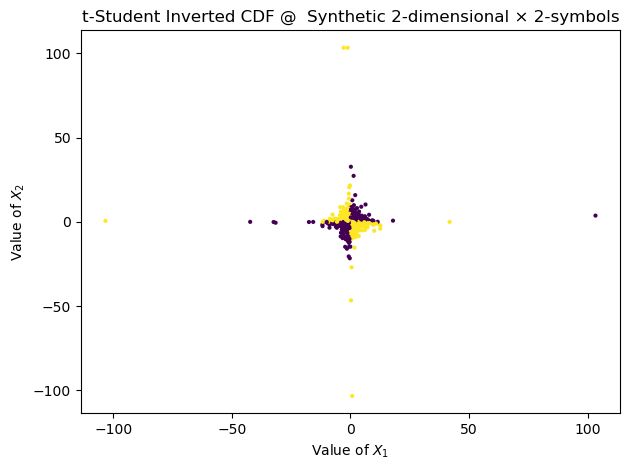

In [17]:
df = 3 # Degrees of freedom

student_cdf_transf = student_cdf(base_task=synthetic_dist_singular_2d, df=df)
student_x_sample, student_y_sample = student_cdf_transf.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=student_x_sample, scenario=singular_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
    X=student_x_sample,                   # Transformed samples along the X-axis
    y=student_y_sample,                   # Original samples along the Y-axis
    cell_boundaries=new_cell_bound,       # Updated cell boundaries for plotting
    title=student_cdf_transf.name,        # Plot title
    plot_cells=False                      # Whether to plot cell boundaries
)

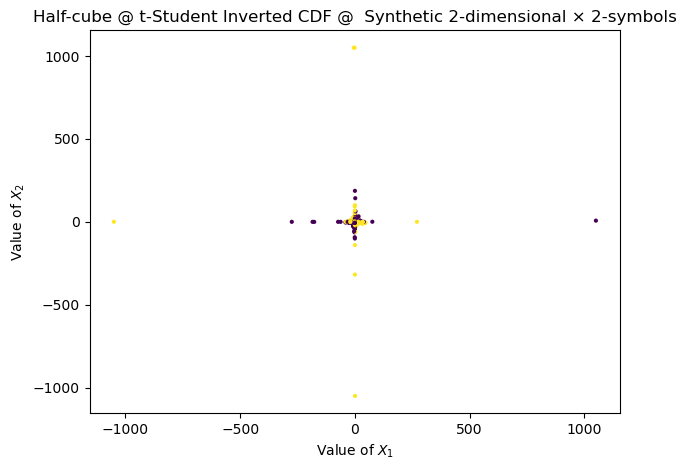

In [18]:
# Apply half-cube mapping
half_cube_map = half_cube(base_task=student_cdf_transf)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=half_cube_x_sample, scenario=singular_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=half_cube_map.name,
   plot_cells=False
   )

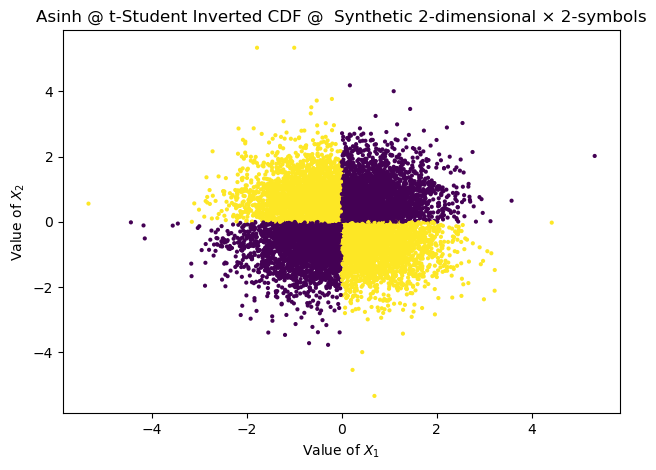

In [19]:
# Apply asinh mapping 
asinh_map = asinh(base_task=student_cdf_transf)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=asinh_x_sample, scenario=singular_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=asinh_map.name,
   plot_cells=False
   )

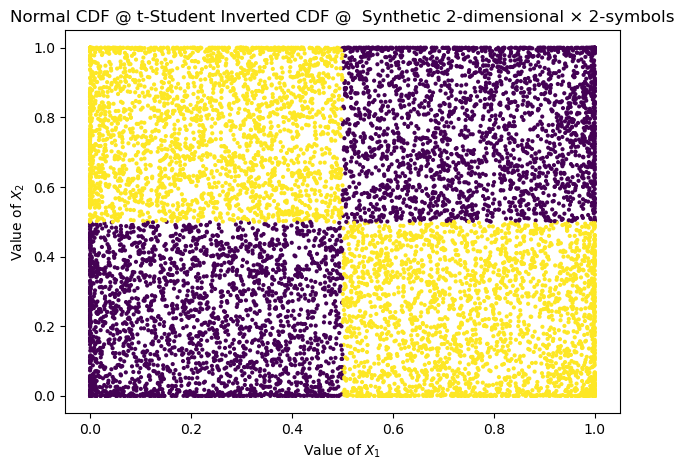

In [20]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(base_task=student_cdf_transf)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=uniform_x_sample, scenario=singular_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=uniform_margins_map.name,
   plot_cells=False
   )

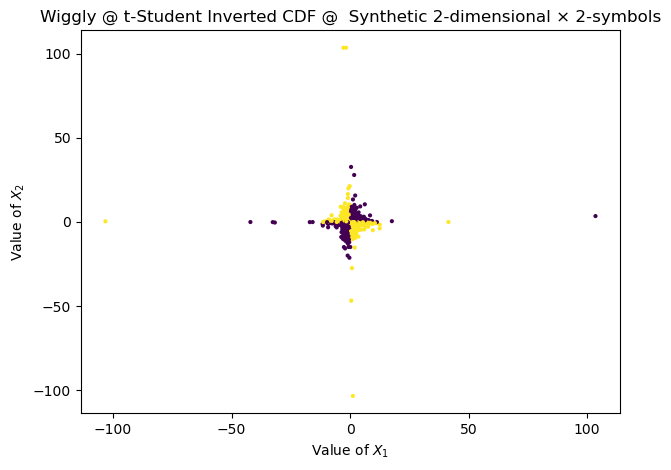

In [21]:
# Apply wiggly transformation
wiggly_map = wiggly(base_task=student_cdf_transf)
wiggly_x_sample, wiggly_y_sample = wiggly_map.sampler.sample_split(n_points=n_samples, rng=SEED, transformer="wiggly")

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=wiggly_x_sample, scenario=singular_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=wiggly_x_sample,
   y=wiggly_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=wiggly_map.name,
   plot_cells=False
   )

Total dimensions: 4


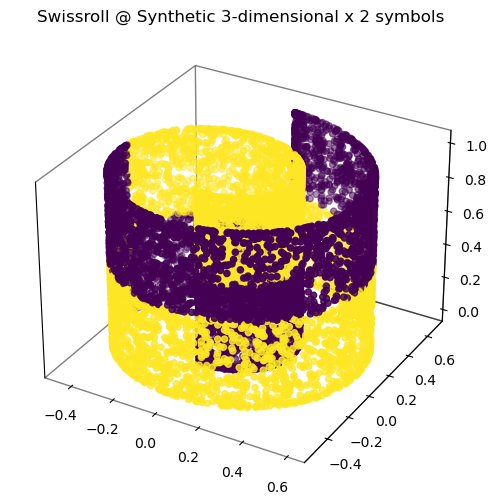

In [24]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(base_task=uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=singular_2d_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

## 2 dimensional x 4 symbols

In [25]:
# Initialize an empty numpy array with 2 elements to store cell boundaries
simple_2d_bounds: np.ndarray = np.empty(shape=2, dtype="object")
# Assign boundaries for the 2D scenario
simple_2d_bounds[:] = [np.array([-1.0, 0.0, 1.0]), np.array([-1.0, 0.0, 1.0])]
# Create a dictionary to define the scenario for the synthetic distribution
simple_2d_scenario: Dict[str, np.ndarray] = {
    # Probabilities for each symbol
    "sym_prob": np.array([0.25, 0.25, 0.25, 0.25]),
    # Cell boundaries in the 2D space
    "cell_bound": simple_2d_bounds,
    # Probabilities for each cell in the 2D grid, structured as 2x2 matrices
    "cell_prob": np.array(
        [
            [[1.0, 0.0], [0.0, 0.0]],  # First symbol's cell probabilities
            [[0.0, 1.0], [0.0, 0.0]],  # Second symbol's cell probabilities
            [[0.0, 0.0], [1.0, 0.0]],  # Third symbol's cell probabilities
            [[0.0, 0.0], [0.0, 1.0]],  # Fourth symbol's cell probabilities
        ]
    ),
}

### Base Case

entropy_y : 2.0
in_shape : [2]
num_classes : 4
max_acc1 : 1.0
total_params : 26
mi_1 : 1.0
mi_2 : 1.0
mi_1-2 : 2.0
joint_mi : 2.0


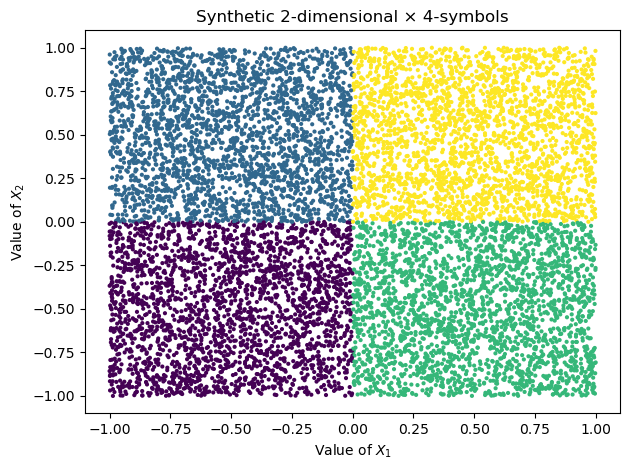

In [26]:
# Number of samples
n_samples = 10_000
# Seed for random number generator to ensure reproducibility
SEED = 1234

# Create a synthetic distribution object
synthetic_dist_simple_2d = task_synthetic(
   cell_boundaries=simple_2d_scenario['cell_bound'],
   symbol_probabilities=simple_2d_scenario['sym_prob'],
   cell_probabilities=simple_2d_scenario['cell_prob']
   )
# Print elements of the metadata
for element in synthetic_dist_simple_2d.sampler.get_metadata().items():
    print(f"{element[0]} : {element[1]}")
    
# Sample 'n_samples' data points from the synthetic distribution 
x_sample, y_sample = synthetic_dist_simple_2d.sample(n_samples=n_samples, seed=SEED)
# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=x_sample,
   y=y_sample, 
   cell_boundaries=simple_2d_scenario['cell_bound'], 
   title=synthetic_dist_simple_2d.name,
   plot_cells=False
   )

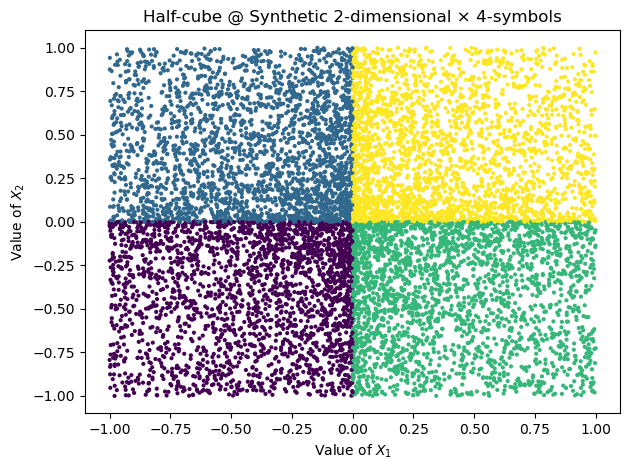

In [27]:
# Apply halh-cube mapping
half_cube_map = half_cube(base_task=synthetic_dist_simple_2d)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=half_cube_x_sample, scenario=simple_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=half_cube_map.name,
   plot_cells=False
   )

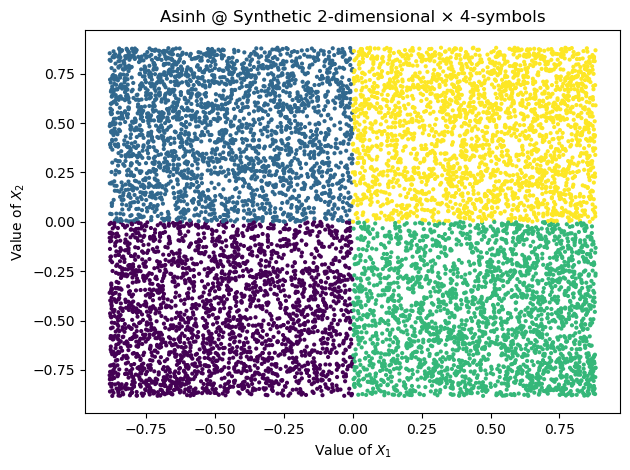

In [28]:
# Apply asinh mapping
asinh_map = asinh(base_task=synthetic_dist_simple_2d)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=asinh_x_sample, scenario=simple_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=asinh_map.name,
   plot_cells=False
   )

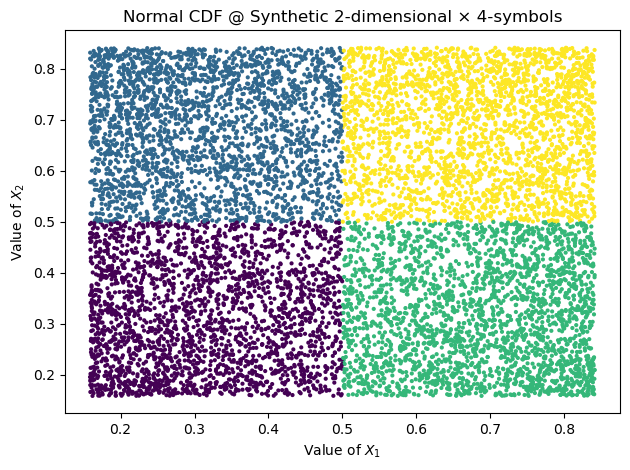

In [29]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(base_task=synthetic_dist_simple_2d)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=uniform_x_sample, scenario=simple_2d_scenario)
# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=uniform_margins_map.name
   )

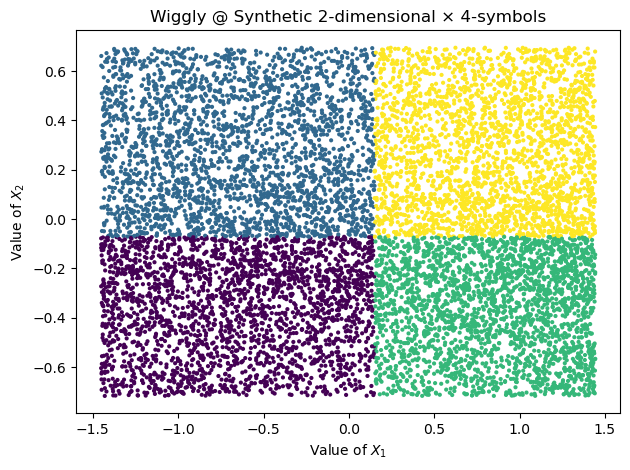

In [30]:
# Apply wiggly transformation
wiggly_map = wiggly(base_task=synthetic_dist_simple_2d)
wiggly_x_sample, wiggly_y_sample = wiggly_map.sampler.sample_split(n_points=n_samples, rng=SEED, transformer="wiggly")

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=wiggly_x_sample, scenario=simple_2d_scenario)
# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=wiggly_x_sample,
   y=wiggly_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=wiggly_map.name
   )

Totall dimensions: 4


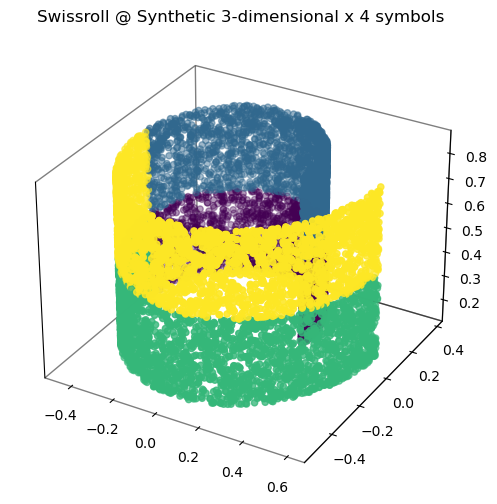

In [31]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(base_task=uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Totall dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=simple_2d_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

### Gaussian transformed

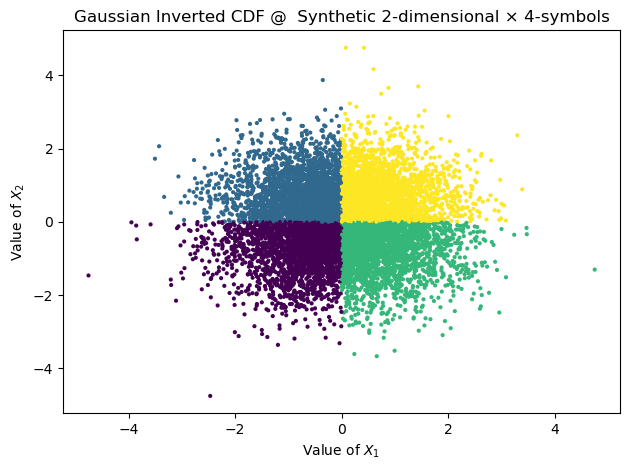

In [32]:
gaussian_cdf_transf = gaussian_cdf(base_task=synthetic_dist_simple_2d)
gaussian_x_sample, gaussian_y_sample  = gaussian_cdf_transf.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=gaussian_x_sample, scenario=simple_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
    X=gaussian_x_sample,                  
    y=gaussian_y_sample,                           
    cell_boundaries=new_cell_bound,       
    title=gaussian_cdf_transf.name,  
    plot_cells=False                      
    )

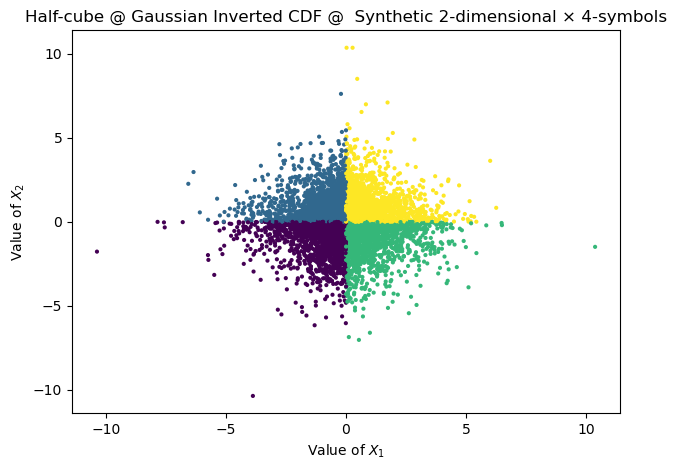

In [33]:
# Apply half-cube mapping
half_cube_map = half_cube(base_task=gaussian_cdf_transf)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=half_cube_x_sample, scenario=simple_2d_scenario)
# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=half_cube_map.name,
   plot_cells=False
   )

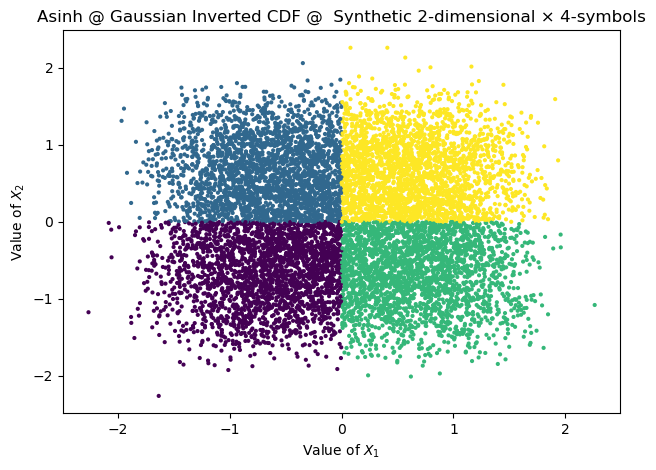

In [34]:
# Apply asinh mapping 
asinh_map = asinh(base_task=gaussian_cdf_transf)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=asinh_x_sample, scenario=simple_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=asinh_map.name,
   plot_cells=False
   )

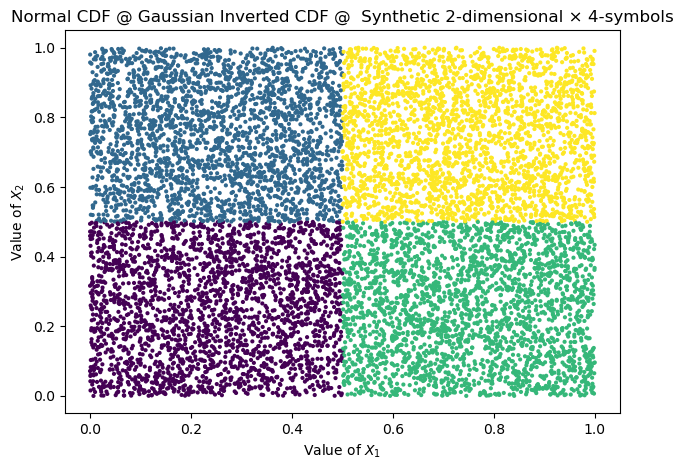

In [35]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(base_task=gaussian_cdf_transf)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=uniform_x_sample, scenario=simple_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=uniform_margins_map.name,
   plot_cells=False
   )

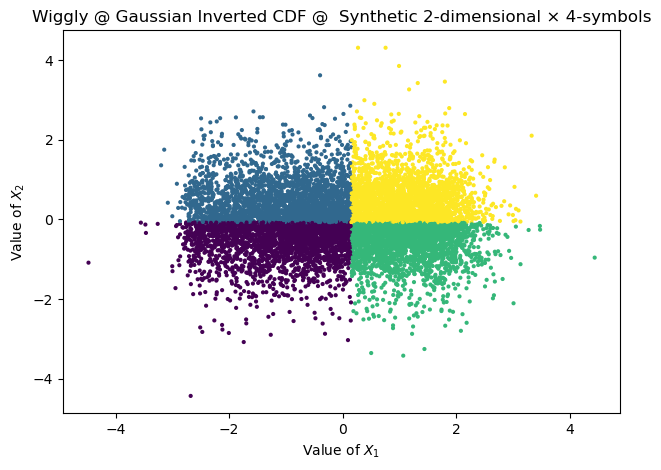

In [36]:
# Apply wiggly transformation
wiggly_map = wiggly(base_task=gaussian_cdf_transf)
wiggly_x_sample, wiggly_y_sample = wiggly_map.sampler.sample_split(n_points=n_samples, rng=SEED, transformer="wiggly")

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=wiggly_x_sample, scenario=simple_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=wiggly_x_sample,
   y=wiggly_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=wiggly_map.name,
   plot_cells=False
   )

Total dimensions: 4


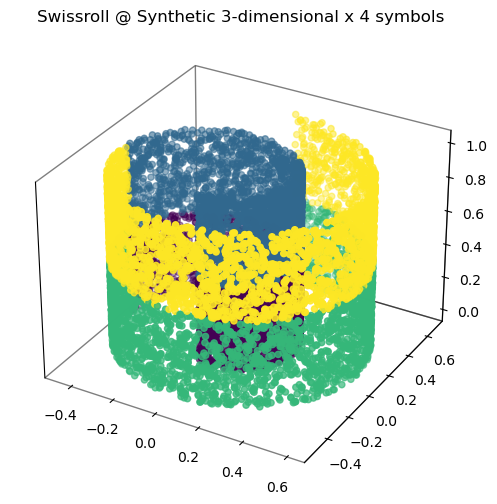

In [37]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(base_task=uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=simple_2d_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

### t-student transfomed

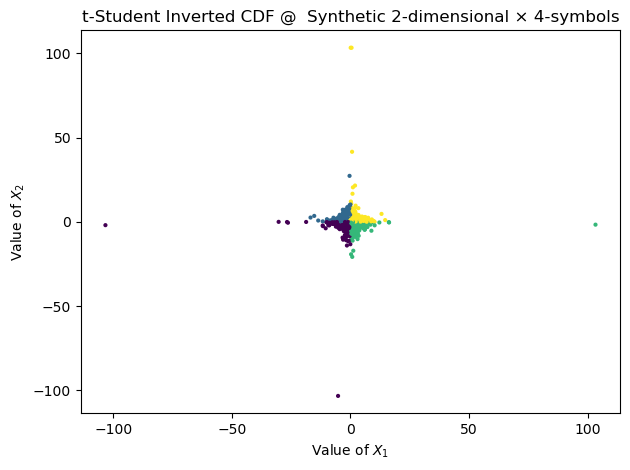

In [38]:
df = 3 # Degrees of freedom

student_cdf_transf = student_cdf(base_task=synthetic_dist_simple_2d, df=df)
student_x_sample, student_y_sample = student_cdf_transf.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=student_x_sample, scenario=simple_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
    X=student_x_sample,                  
    y=student_y_sample,                           
    cell_boundaries=new_cell_bound,       
    title=student_cdf_transf.name,  
    plot_cells=False                      
)

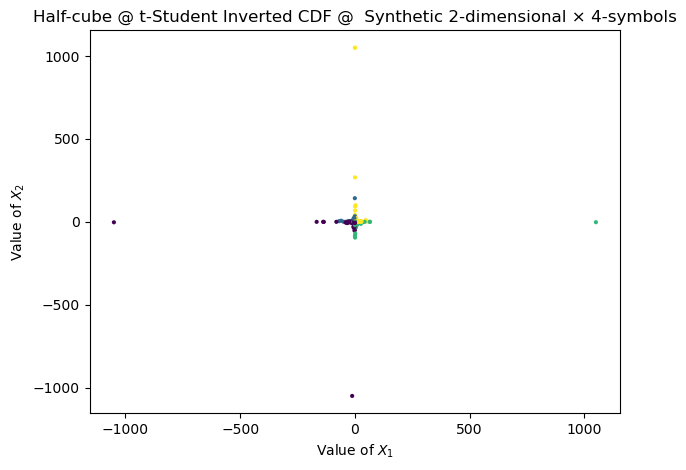

In [39]:
# Apply half-cube mapping
half_cube_map = half_cube(base_task=student_cdf_transf)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=half_cube_x_sample, scenario=simple_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=half_cube_map.name,
   plot_cells=False
   )

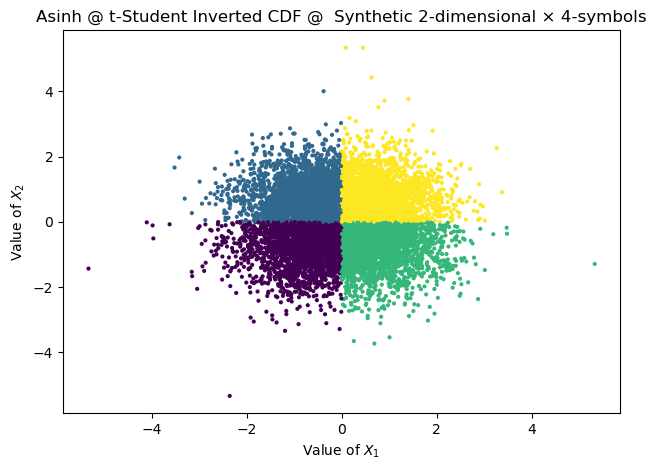

In [40]:
# Apply asinh mapping 
asinh_map = asinh(base_task=student_cdf_transf)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=asinh_x_sample, scenario=simple_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=asinh_map.name
   )

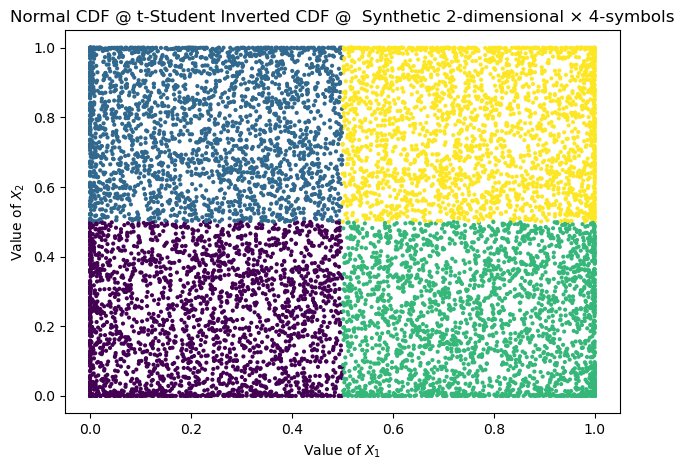

In [41]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(base_task=student_cdf_transf)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=uniform_x_sample, scenario=simple_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=uniform_margins_map.name
   )

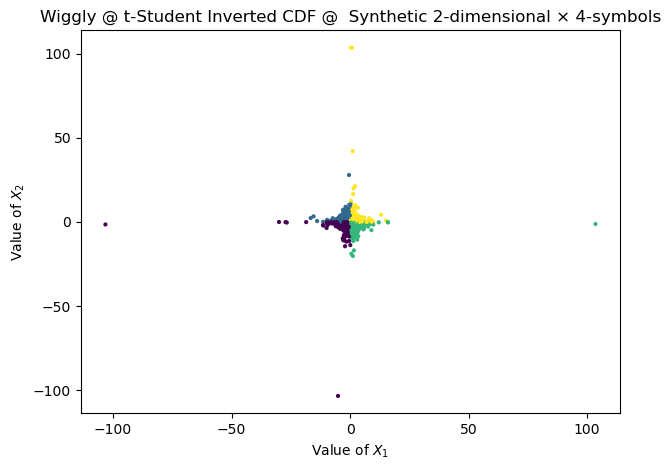

In [42]:
# Apply wiggly transformation
wiggly_map = wiggly(base_task=student_cdf_transf)
wiggly_x_sample, wiggly_y_sample = wiggly_map.sampler.sample_split(n_points=n_samples, rng=SEED, transformer="wiggly")

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=wiggly_x_sample, scenario=simple_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=wiggly_x_sample,
   y=wiggly_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=wiggly_map.name,
   plot_cells=False
   )

Total dimensions: 4


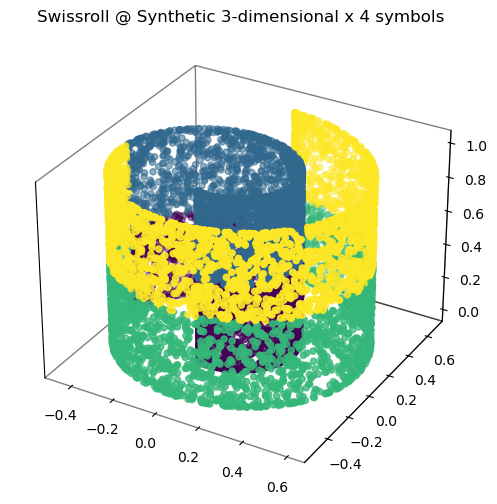

In [43]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(base_task=uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)


print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=simple_2d_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

## 2 dimensional x 3 symbols

In [2]:
# Define a base probability array for the demonstration scenario.
base_demo_probabilities: np.ndarray = np.array(
    [
        [[0.4, 0.05], [0.3, 0.0], [0.2, 0.0], [0.05, 0.0]],  
        [[0.0, 0.2], [0.0, 0.3], [0.3, 0.0], [0.2, 0.0]],   
        [[0.0, 0.0], [0.0, 0.0], [0.0, 0.7], [0.3, 0.0]],   
    ]
)
# Create a dictionary to define the 2D scenario for the synthetic distribution
demo_2d_scenario: Dict[str, np.ndarray] = {
    # Probabilities for each symbol
    "sym_prob": np.array([0.2, 0.5, 0.3]),
    # Cell boundaries in the 2D space
    "cell_bound": np.array(
        [
            np.array([-0.5, 0.5, 1.5, 2.0, 3.5]),  
            np.array([1.0, 1.5, 2.5])
        ],
        dtype="object",
    ),
    # Cell probabilities copied from the base probabilities array
    "cell_prob": np.copy(a=base_demo_probabilities),
    }

### Base case

entropy_y : 1.4854752972273344
in_shape : [2]
num_classes : 3
max_acc1 : 0.85
total_params : 35
mi_1 : 0.3273492607035492
mi_2 : 0.17573492737534044
mi_1-2 : 1.0491584310940363
joint_mi : 1.0491584310940363


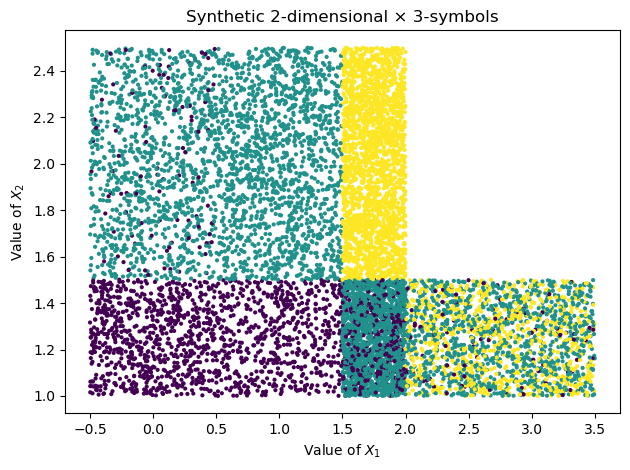

In [45]:
# Number of samples
n_samples = 10_000
# Seed for random number generator to ensure reproducibility
SEED = 1234

# Create a synthetic distribution object
synthetic_dist_demo_2d = task_synthetic(
   cell_boundaries=demo_2d_scenario['cell_bound'],
   symbol_probabilities=demo_2d_scenario['sym_prob'],
   cell_probabilities=demo_2d_scenario['cell_prob']
   )
# Print elements of the metadata
for element in synthetic_dist_demo_2d.sampler.get_metadata().items():
    print(f"{element[0]} : {element[1]}")
    
# Sample 'n_samples' data points from the synthetic distribution 
x_sample, y_sample = synthetic_dist_demo_2d.sample(n_samples=n_samples, seed=SEED)
# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=x_sample,
   y=y_sample, 
   cell_boundaries=demo_2d_scenario['cell_bound'], 
   title=synthetic_dist_demo_2d.name,
   plot_cells=False
   )

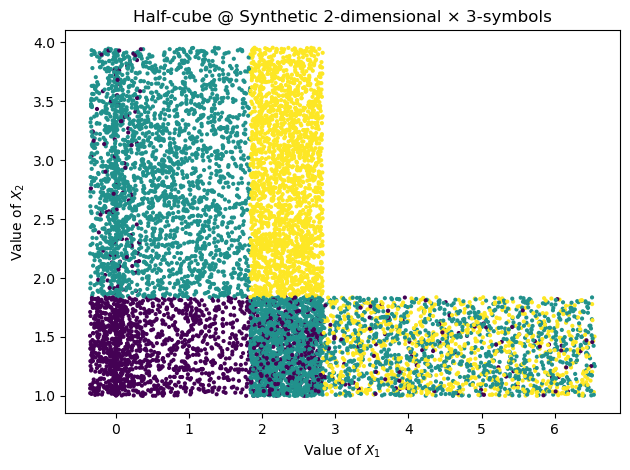

In [46]:
# Apply half-cube mapping
half_cube_map = half_cube(base_task=synthetic_dist_demo_2d)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=half_cube_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=half_cube_map.name,
   plot_cells=False
   )

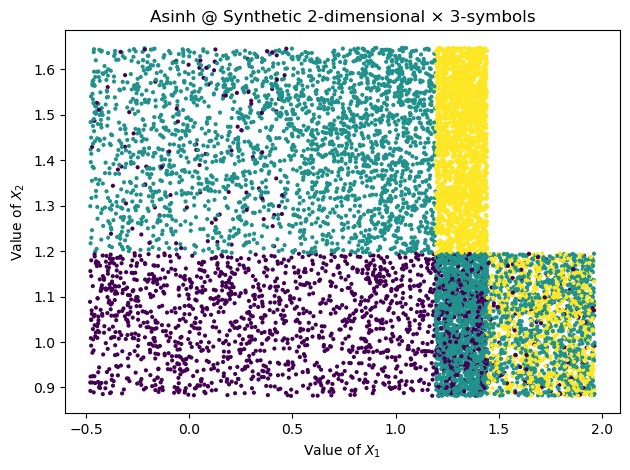

In [47]:
# Apply asinh mapping
asinh_map = asinh(base_task=synthetic_dist_demo_2d)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=asinh_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=asinh_map.name,
   plot_cells=False
   )

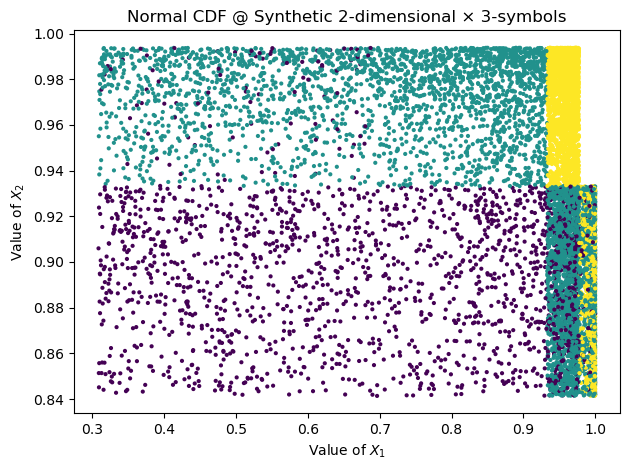

In [48]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(base_task=synthetic_dist_demo_2d)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=uniform_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=uniform_margins_map.name,
   plot_cells=False
   )

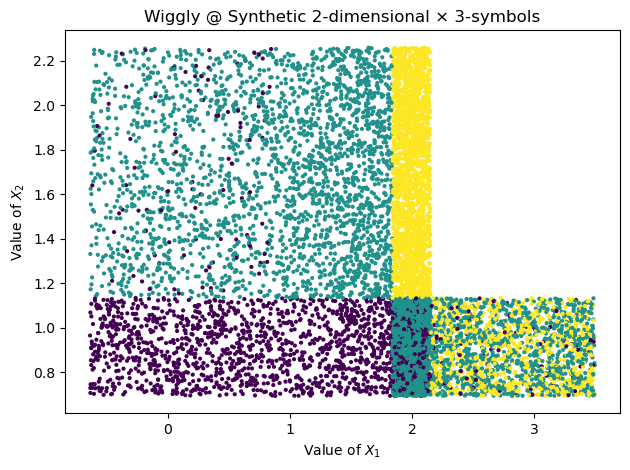

In [49]:
# Apply wiggly transformation
wiggly_map = wiggly(base_task=synthetic_dist_demo_2d)
wiggly_x_sample, wiggly_y_sample = wiggly_map.sampler.sample_split(n_points=n_samples, rng=SEED, transformer="wiggly")

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=wiggly_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=wiggly_x_sample,
   y=wiggly_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=wiggly_map.name,
   plot_cells=False
   )

Total dimensions: 4


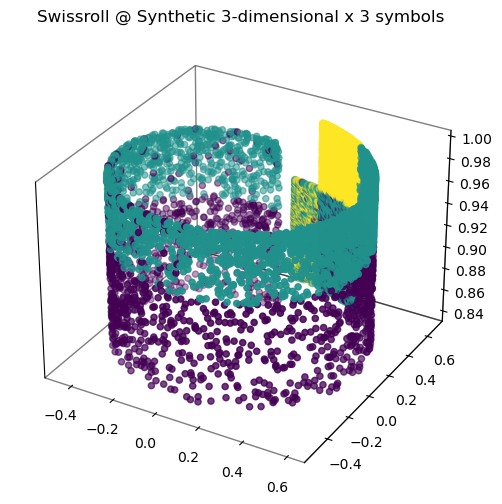

In [50]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(base_task=uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=demo_2d_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

### Gaussian transformed

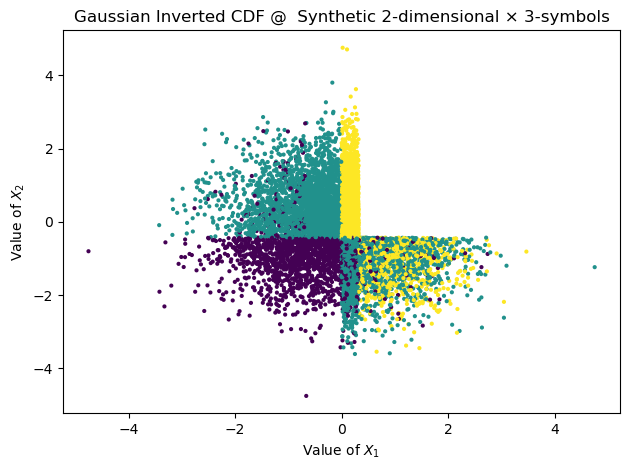

In [51]:
gaussian_cdf_transf = gaussian_cdf(base_task=synthetic_dist_demo_2d)
gaussian_x_sample, gaussian_y_sample  = gaussian_cdf_transf.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=gaussian_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
    X=gaussian_x_sample,                  
    y=gaussian_y_sample,                           
    cell_boundaries=new_cell_bound,       
    title=gaussian_cdf_transf.name,  
    plot_cells=False                      
)

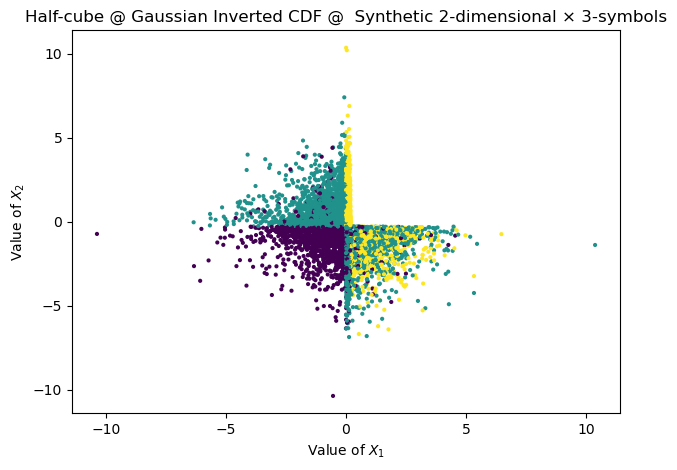

In [52]:
# Apply half-cube mapping
half_cube_map = half_cube(base_task=gaussian_cdf_transf)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=half_cube_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=half_cube_map.name,
   plot_cells=False
   )

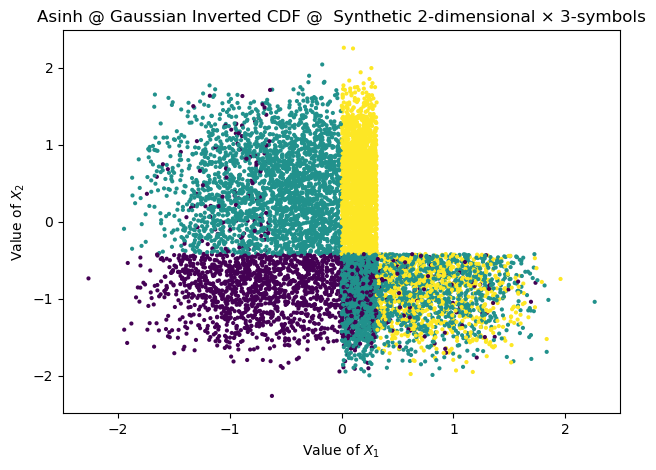

In [53]:
# Apply asinh mapping 
asinh_map = asinh(base_task=gaussian_cdf_transf)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=asinh_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=asinh_map.name
   )

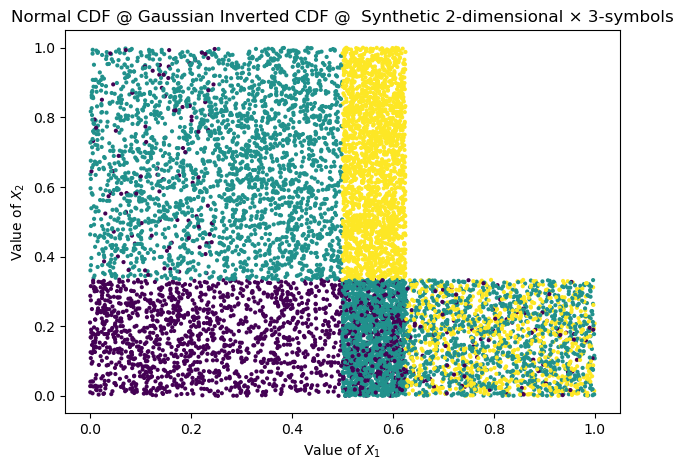

In [54]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(base_task=gaussian_cdf_transf)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=uniform_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=uniform_margins_map.name
   )

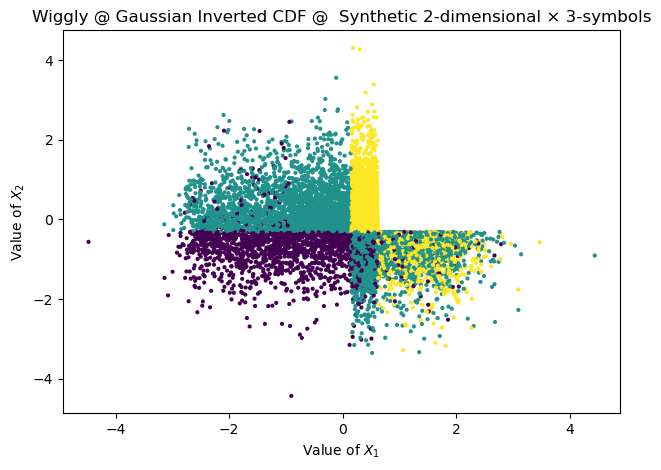

In [55]:
# Apply wiggly transformation
wiggly_map = wiggly(base_task=gaussian_cdf_transf)
wiggly_x_sample, wiggly_y_sample = wiggly_map.sampler.sample_split(n_points=n_samples, rng=SEED, transformer="wiggly")

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=wiggly_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=wiggly_x_sample,
   y=wiggly_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=wiggly_map.name,
   plot_cells=False
   )

Total dimensions: 4


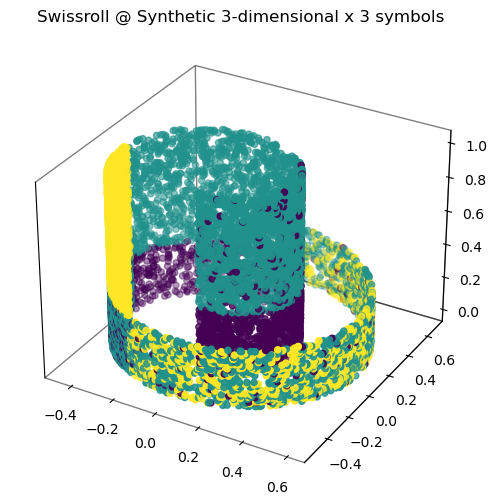

In [56]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(base_task=uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=demo_2d_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

### t-student transformed

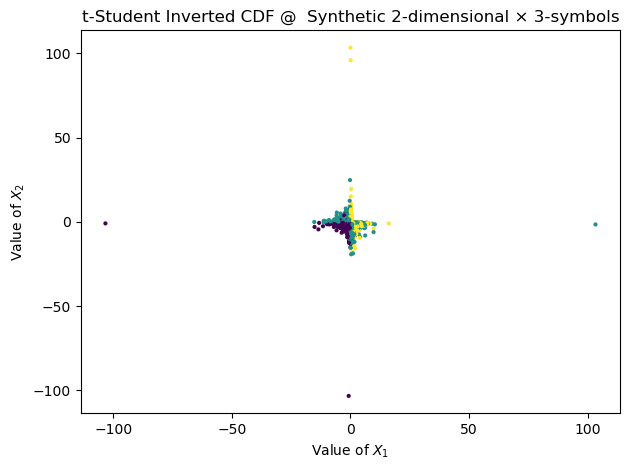

In [57]:
df = 3 # Degrees of freedom

student_cdf_transf = student_cdf(base_task=synthetic_dist_demo_2d, df=df)
student_x_sample, student_y_sample = student_cdf_transf.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=student_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
    X=student_x_sample,                  
    y=student_y_sample,                           
    cell_boundaries=new_cell_bound,       
    title=student_cdf_transf.name,  
    plot_cells=False                      
)

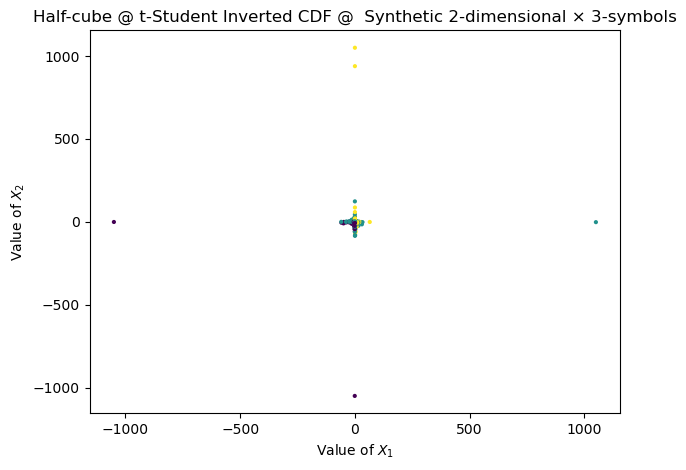

In [58]:
# Apply half-cube mapping
half_cube_map = half_cube(base_task=student_cdf_transf)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=half_cube_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=half_cube_map.name,
   plot_cells=False
   )

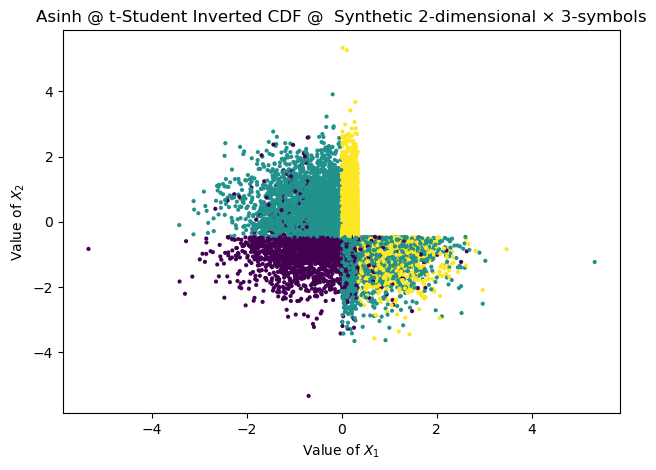

In [59]:
# Apply asinh mapping 
asinh_map = asinh(base_task=student_cdf_transf)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=asinh_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=asinh_map.name,
   plot_cells=False
   )

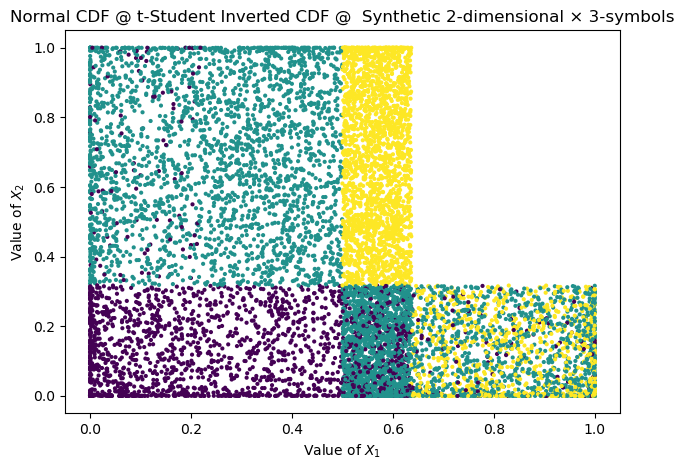

In [60]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(base_task=student_cdf_transf)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=uniform_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=uniform_margins_map.name,
   plot_cells=False
   )

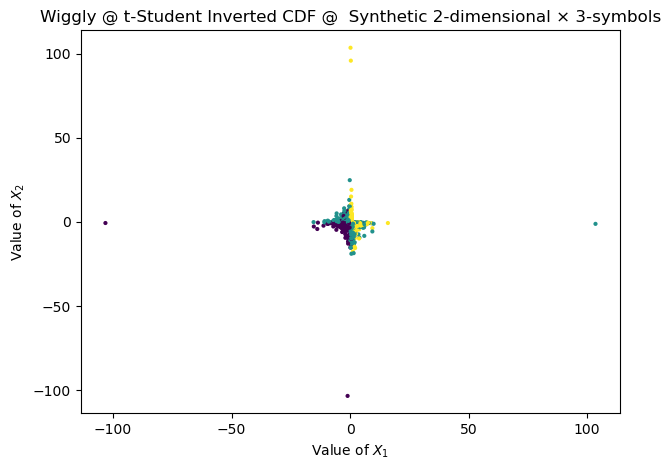

In [61]:
# Apply wiggly transformation
wiggly_map = wiggly(base_task=student_cdf_transf)
wiggly_x_sample, wiggly_y_sample = wiggly_map.sampler.sample_split(n_points=n_samples, rng=SEED, transformer="wiggly")

# Obtain new cell bounds
new_cell_bound = update_cell_bounds(samples=wiggly_x_sample, scenario=demo_2d_scenario)

# Plot the 2D figure of the sampled data points
plot_2d_figure(
   X=wiggly_x_sample,
   y=wiggly_y_sample, 
   cell_boundaries=new_cell_bound, 
   title=wiggly_map.name,
   plot_cells=False
   )

Total dimensions: 4


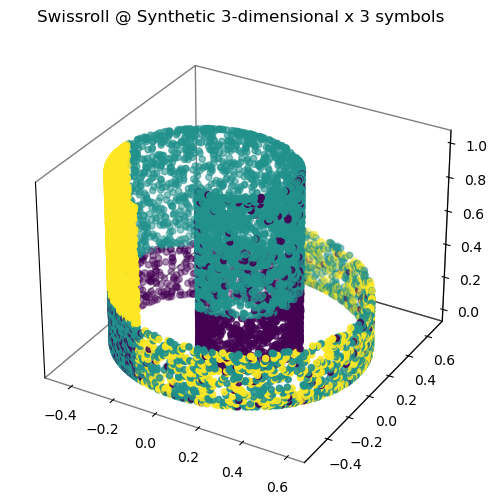

In [62]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(base_task=uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=demo_2d_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

## 3 dimensional x 8 symbols

In [63]:
# Initialize an empty numpy array with 3 elements to store cell boundaries
simple_3d_bounds: np.ndarray = np.empty(shape=3, dtype="object")
# Assign the same boundaries for each of the 3 dimensions
simple_3d_bounds[:] = [np.array([-1.0, 0.0, 1.0])] * 3

# Create a dictionary to define the scenario for the synthetic 3D distribution
simple_3d_scenario: Dict[str, np.ndarray] = {
    # Probabilities for each of the 8 symbols, each with equal probability of 0.125
    "sym_prob": np.ones(shape=8) * 0.125,
    # Cell boundaries in the 3D space
    "cell_bound": simple_3d_bounds,
    # Probabilities for each cell in the 3D grid, structured as 2x2x2 matrices
    "cell_prob": np.array(
        [
            [[[1.0, 0.0], [0.0, 0.0]], [[0.0, 0.0], [0.0, 0.0]]],  # First symbol's cell probabilities
            [[[0.0, 1.0], [0.0, 0.0]], [[0.0, 0.0], [0.0, 0.0]]],  # Second symbol's cell probabilities
            [[[0.0, 0.0], [1.0, 0.0]], [[0.0, 0.0], [0.0, 0.0]]],  # Third symbol's cell probabilities
            [[[0.0, 0.0], [0.0, 1.0]], [[0.0, 0.0], [0.0, 0.0]]],  # Fourth symbol's cell probabilities
            [[[0.0, 0.0], [0.0, 0.0]], [[1.0, 0.0], [0.0, 0.0]]],  # Fifth symbol's cell probabilities
            [[[0.0, 0.0], [0.0, 0.0]], [[0.0, 1.0], [0.0, 0.0]]],  # Sixth symbol's cell probabilities
            [[[0.0, 0.0], [0.0, 0.0]], [[0.0, 0.0], [1.0, 0.0]]],  # Seventh symbol's cell probabilities
            [[[0.0, 0.0], [0.0, 0.0]], [[0.0, 0.0], [0.0, 1.0]]],  # Eighth symbol's cell probabilities
        ]
    ),
}

### Base case


entropy_y : 3.0
in_shape : [3]
num_classes : 8
max_acc1 : 1.0
total_params : 81
mi_1 : 1.0
mi_2 : 1.0
mi_3 : 1.0
mi_1-2 : 2.0
mi_1-3 : 2.0
mi_2-3 : 2.0
mi_1-2-3 : 3.0
joint_mi : 3.0


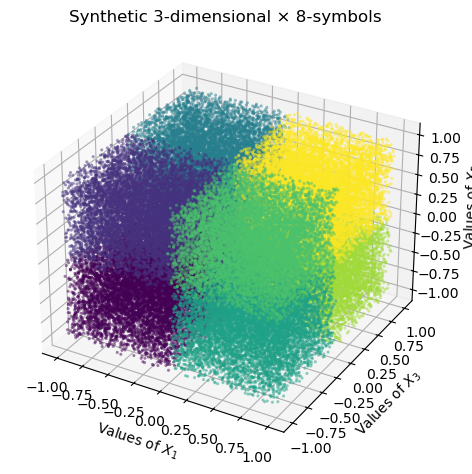

In [64]:
# Number of samples
n_samples = 70_000
# Seed for random number generator to ensure reproducibility
SEED = 1234

# Create a synthetic distribution object
synthetic_dist_simple_3d = task_synthetic(
   cell_boundaries=simple_3d_scenario['cell_bound'],
   symbol_probabilities=simple_3d_scenario['sym_prob'],
   cell_probabilities=simple_3d_scenario['cell_prob']
   )
# Print elements of the metadata
for element in synthetic_dist_simple_3d.sampler.get_metadata().items():
    print(f"{element[0]} : {element[1]}")

# Sample 'n_samples' data points from the synthetic distribution 
x_sample, y_sample = synthetic_dist_simple_3d.sample(n_samples=n_samples, seed=SEED)
# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=x_sample,
   y=y_sample, 
   cell_boundaries=simple_3d_scenario['cell_bound'], 
   title=synthetic_dist_simple_3d.name
   )

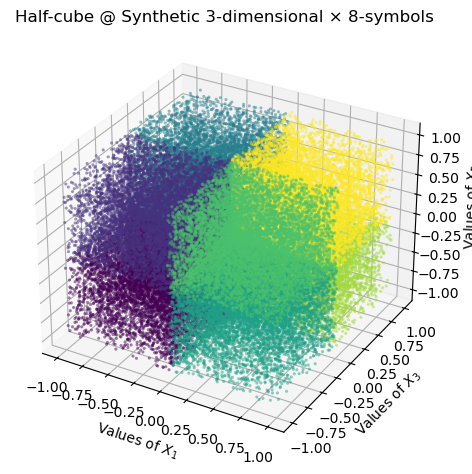

In [65]:
# Apply half-cube mapping
half_cube_map = half_cube(synthetic_dist_simple_3d)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=simple_3d_scenario['cell_bound'], 
   title=half_cube_map.name
   )

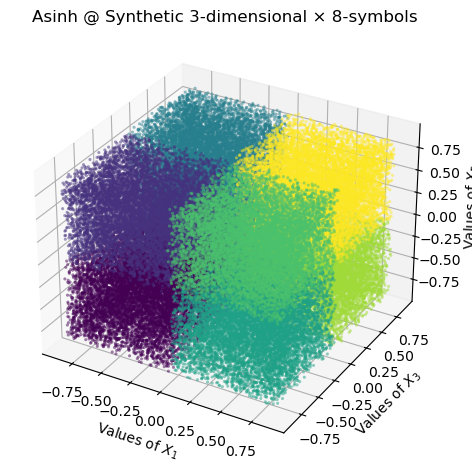

In [66]:
# Apply asinh mapping
asinh_map = asinh(synthetic_dist_simple_3d)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=simple_3d_scenario['cell_bound'], 
   title=asinh_map.name
   )

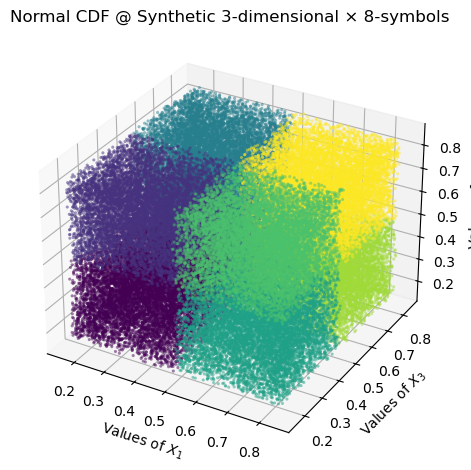

In [67]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(synthetic_dist_simple_3d)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=simple_3d_scenario['cell_bound'], 
   title=uniform_margins_map.name
   )

Total dimensions: 6


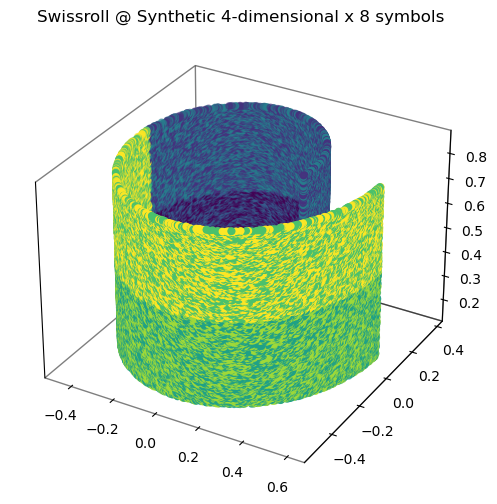

In [70]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=simple_3d_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

### Gaussian transformed

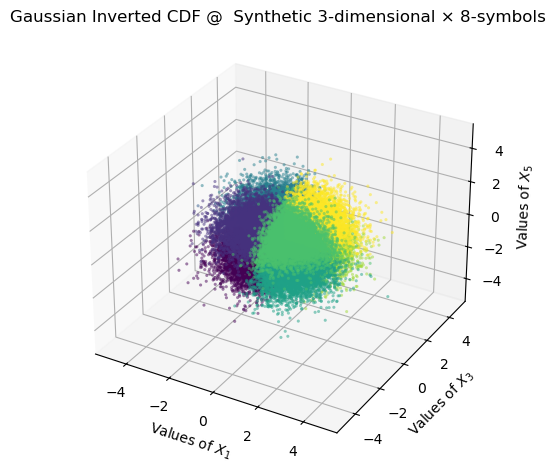

In [71]:
gaussian_cdf_transf = gaussian_cdf(base_task=synthetic_dist_simple_3d)
gaussian_x_sample, gaussian_y_sample = gaussian_cdf_transf.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
    X=gaussian_x_sample,                  
    y=gaussian_y_sample,                           
    cell_boundaries=simple_3d_scenario['cell_bound'],       
    title=gaussian_cdf_transf.name,
)

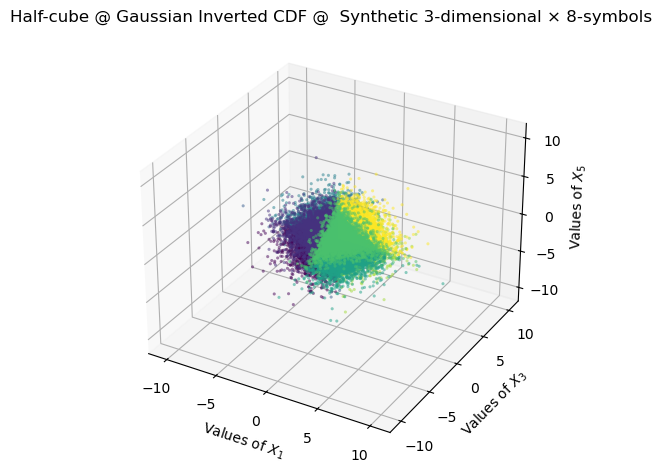

In [72]:
# Apply half-cube mapping
half_cube_map = half_cube(gaussian_cdf_transf)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=simple_3d_scenario['cell_bound'], 
   title=half_cube_map.name
   )

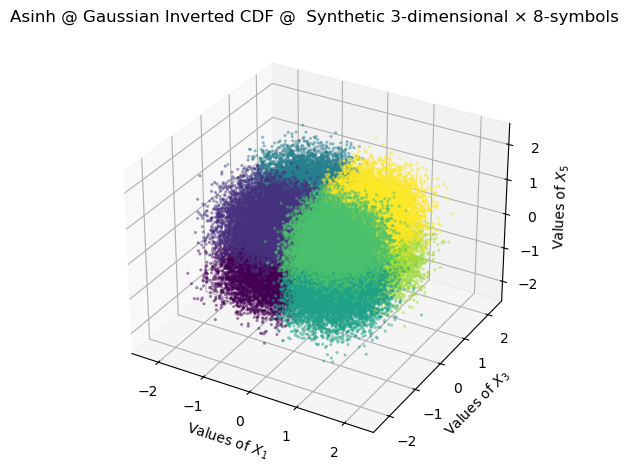

In [73]:
# Apply asinh mapping
asinh_map = asinh(gaussian_cdf_transf)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=simple_3d_scenario['cell_bound'], 
   title=asinh_map.name
   )

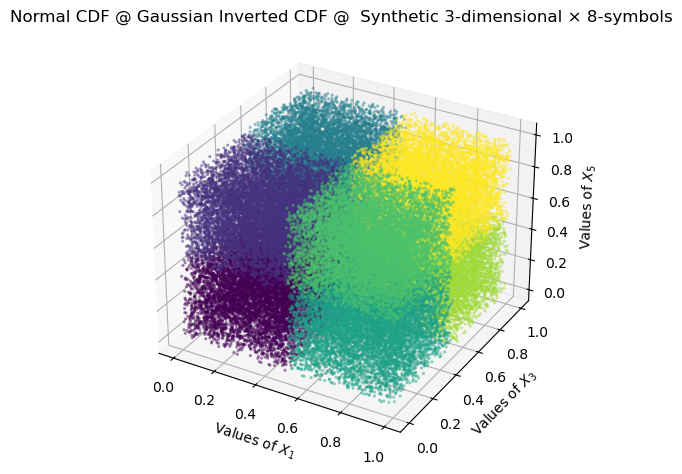

In [74]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(gaussian_cdf_transf)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=simple_3d_scenario['cell_bound'], 
   title=uniform_margins_map.name
   )

Total dimensions: 6


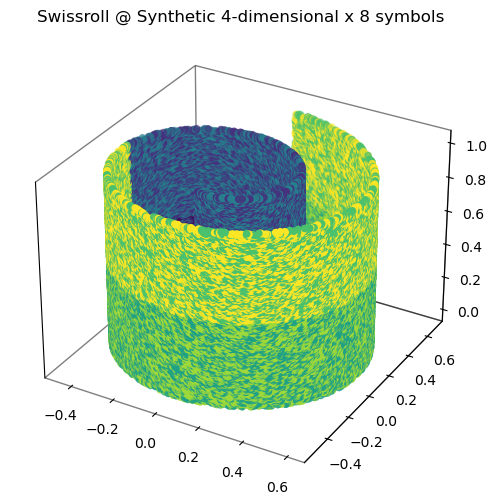

In [75]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=simple_3d_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

### t-student transformed

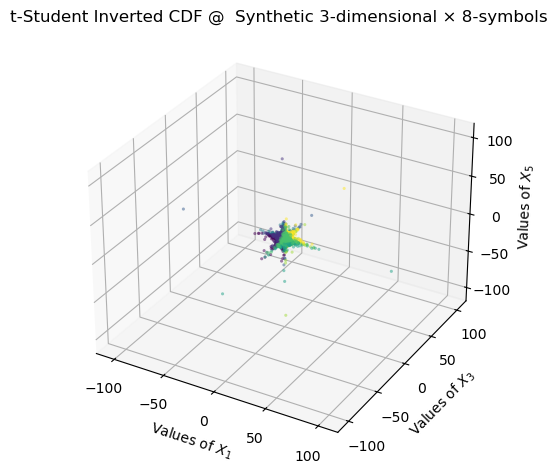

In [76]:
df = 3  # Degrees of freedom 

student_cdf_transf = student_cdf(base_task=synthetic_dist_simple_3d, df=df)
student_x_sample, student_y_sample = student_cdf_transf.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
    X=student_x_sample,                  
    y=student_y_sample,                           
    cell_boundaries=simple_3d_scenario['cell_bound'],      
    title=student_cdf_transf.name,  
)

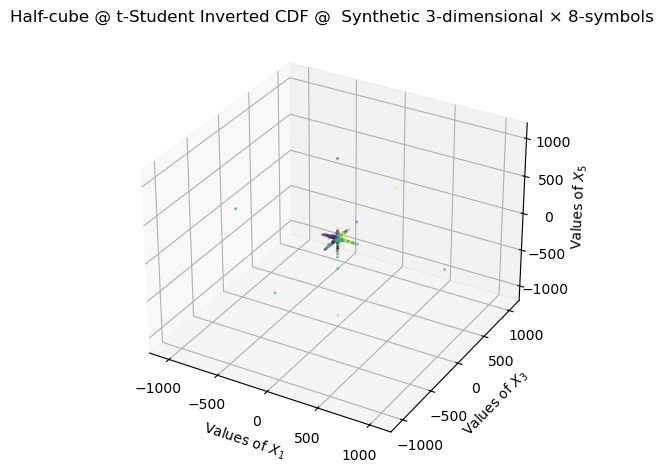

In [77]:
# Apply half-cube mapping
half_cube_map = half_cube(student_cdf_transf)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=simple_3d_scenario['cell_bound'], 
   title=half_cube_map.name
   )

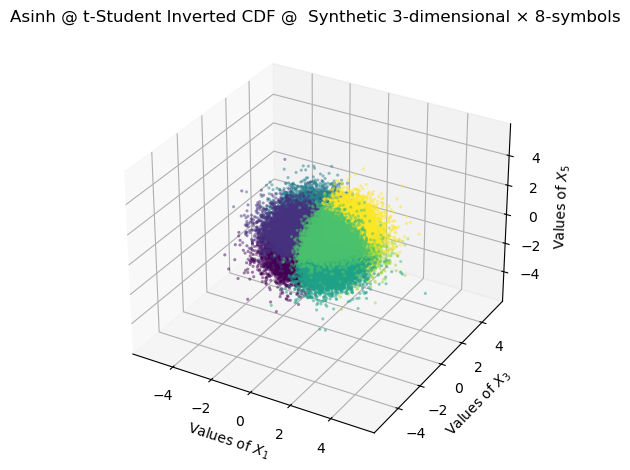

In [78]:
# Apply asinh mapping
asinh_map = asinh(student_cdf_transf)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=simple_3d_scenario['cell_bound'], 
   title=asinh_map.name
   )

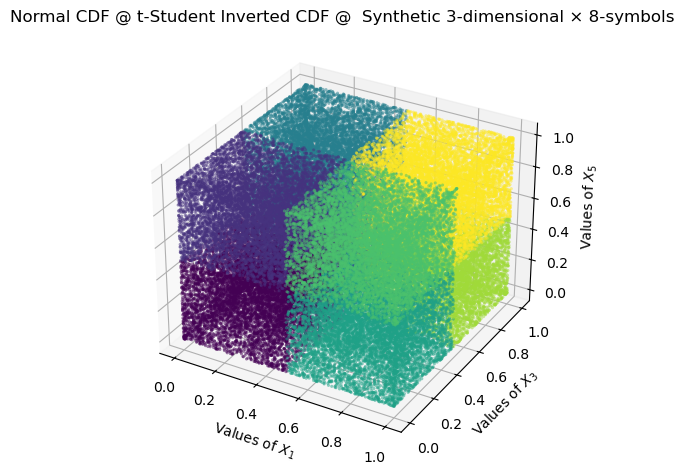

In [79]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(student_cdf_transf)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=simple_3d_scenario['cell_bound'], 
   title=uniform_margins_map.name
   )

Total dimensions: 6


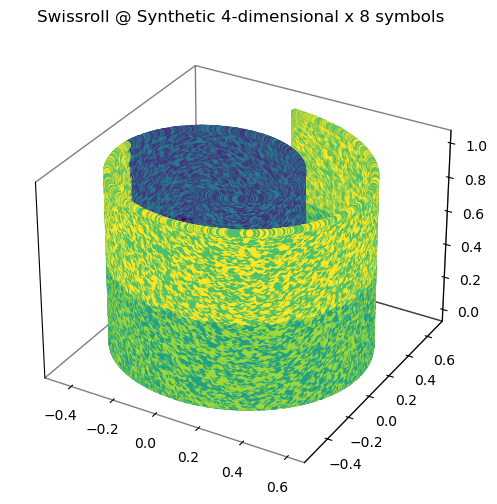

In [82]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot
plot_swissroll(
   distribution=swissroll_emb,
   scenario=simple_3d_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

## 5 dimensional x 3 symbols

In [3]:
# Initialize an empty numpy array to store the study scenario probabilities
study_scenario_probabilities: np.ndarray = np.empty(
    shape=base_demo_probabilities.shape[:-1] + (4,) + base_demo_probabilities.shape[-1:]
)

# Copy the base demo probabilities into different slices of the new array
study_scenario_probabilities[..., 0, :] = np.copy(a=base_demo_probabilities)
study_scenario_probabilities[..., 1, :] = np.copy(a=base_demo_probabilities)
study_scenario_probabilities[..., 2, :] = np.copy(a=base_demo_probabilities)
study_scenario_probabilities[..., 3, :] = np.copy(a=base_demo_probabilities)

# Modify specific slices to zero out certain probabilities
study_scenario_probabilities[0, :, 1, :] = 0.0
study_scenario_probabilities[1, :, 2, :] = 0.0
study_scenario_probabilities[2, :, 3, :] = 0.0

# Normalize the probabilities across certain dimensions
study_scenario_probabilities = study_scenario_probabilities / np.reshape(
    a=np.sum(a=study_scenario_probabilities, axis=(1, 2, 3)), newshape=(3,) + (1,) * 3
)

# Create a dictionary to define the scenario for the study distribution
study_scenario: Dict[str, np.ndarray] = {
    # Use the symbol probabilities from the demo 2D scenario
    "sym_prob": demo_2d_scenario["sym_prob"],

    # Define the cell boundaries for the study scenario
    "cell_bound": np.array(
        [
            demo_2d_scenario["cell_bound"][0],  
            np.array([-2.0, 2.0]),  
            np.array([-1.0, 0.0, 0.3, 1.0, 3.0]),  
            np.array([4.0, 4.5]),  
            demo_2d_scenario["cell_bound"][-1],  
        ],
        dtype="object",
    ),
    
    # Reshape the cell probabilities to add new axes for the scenario
    "cell_prob": study_scenario_probabilities[..., np.newaxis, :, np.newaxis, :],
}

### Base case

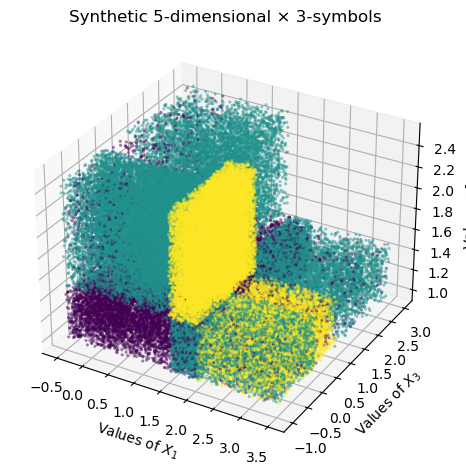

entropy_y : 1.4854752972273344
in_shape : [5]
num_classes : 3
max_acc1 : 0.8966666666666667
total_params : 116
mi_1 : 0.32734926070354914
mi_2 : 0.0
mi_3 : 0.3725812322969068
mi_4 : 0.0
mi_5 : 0.17573492737534052
mi_1-2 : 0.32734926070354914
mi_1-3 : 0.6633857308999657
mi_1-4 : 0.32734926070354914
mi_1-5 : 1.0491584310940363
mi_2-3 : 0.3725812322969068
mi_2-4 : 0.0
mi_2-5 : 0.17573492737534052
mi_3-4 : 0.3725812322969068
mi_3-5 : 0.5327131818450737
mi_4-5 : 0.17573492737534052
mi_1-2-3 : 0.6633857308999657
mi_1-2-4 : 0.32734926070354914
mi_1-2-5 : 1.0491584310940363
mi_1-3-4 : 0.6633857308999657
mi_1-3-5 : 1.181942440972768
mi_1-4-5 : 1.0491584310940363
mi_2-3-4 : 0.3725812322969068
mi_2-3-5 : 0.5327131818450737
mi_2-4-5 : 0.17573492737534052
mi_3-4-5 : 0.5327131818450737
mi_1-2-3-4 : 0.6633857308999657
mi_1-2-3-5 : 1.181942440972768
mi_1-2-4-5 : 1.0491584310940363
mi_1-3-4-5 : 1.181942440972768
mi_2-3-4-5 : 0.5327131818450737
mi_1-2-3-4-5 : 1.181942440972768
joint_mi : 1.1819424409727

In [4]:
# Number of samples
n_samples = 100_000
# Seed for random number generator to ensure reproducibility
SEED = 1234

# Create a synthetic distribution object
synthetic_dist_study = task_synthetic(
   cell_boundaries=study_scenario['cell_bound'],
   symbol_probabilities=study_scenario['sym_prob'],
   cell_probabilities=study_scenario['cell_prob']
   )
    
# Sample 'n_samples' data points from the synthetic distribution 
x_sample, y_sample = synthetic_dist_study.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=x_sample,
   y=y_sample, 
   cell_boundaries=study_scenario['cell_bound'], 
   title=synthetic_dist_study.name
   )

# Print elements of the metadata
for element in synthetic_dist_study.sampler.get_metadata().items():
    print(f"{element[0]} : {element[1]}")

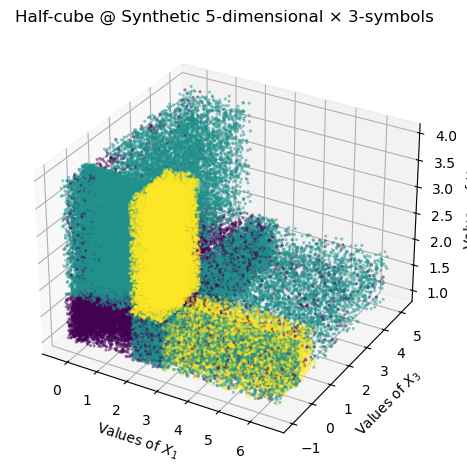

In [85]:
# Apply half-cube mapping
half_cube_map = half_cube(synthetic_dist_study)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=study_scenario['cell_bound'], 
   title=half_cube_map.name,
   savedata=False
   )

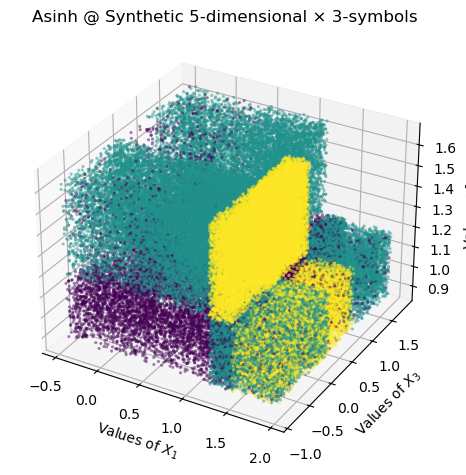

In [86]:
# Apply asinh mapping
asinh_map = asinh(synthetic_dist_study)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=study_scenario['cell_bound'], 
   title=asinh_map.name
   )

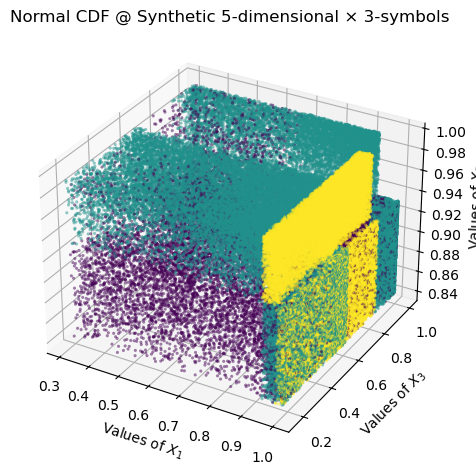

In [87]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(synthetic_dist_study)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=study_scenario['cell_bound'], 
   title=uniform_margins_map.name
   )

Total dimensions: 10


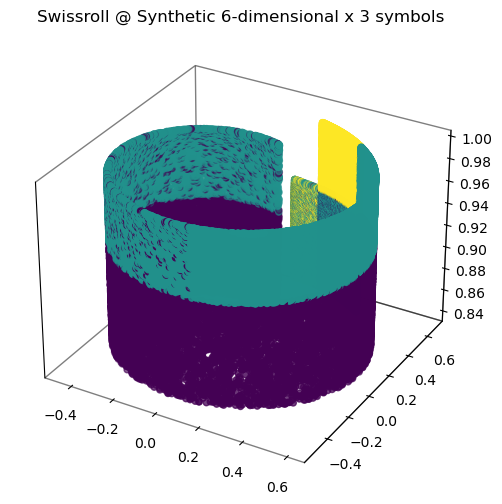

In [88]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot with dimensions [0, 1]
plot_swissroll(
   distribution=swissroll_emb,
   scenario=study_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

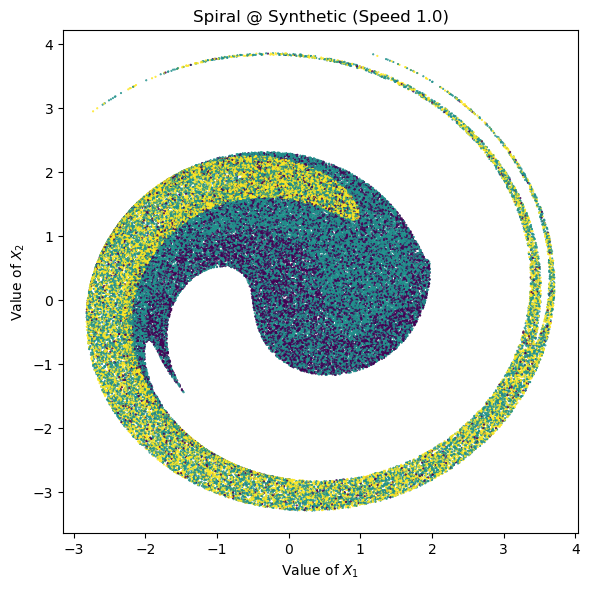

In [8]:
# Generate data for a Swiss roll embedding task
dims = [2, 3]
speed_list = [0.5, 1.0, 1.5]

# Generate spiral data for the given speed
spiral_diff = spiral(base_task=synthetic_dist_study, task_name="Spiral @ Synthetic", speed=speed_list[1], x_dim=dims[0], y_dim=dims[1])
x_spiral, y_spiral = spiral_diff.sampler.sample_split(n_points=n_samples, rng=SEED, transformer="spiral", spiral_dims=dims)

plot_spiral(
    X=x_spiral,
    y=y_spiral,
    speed=speed_list[1],
    title=spiral_diff.name,
    savedata=True)

### Gaussian transformed

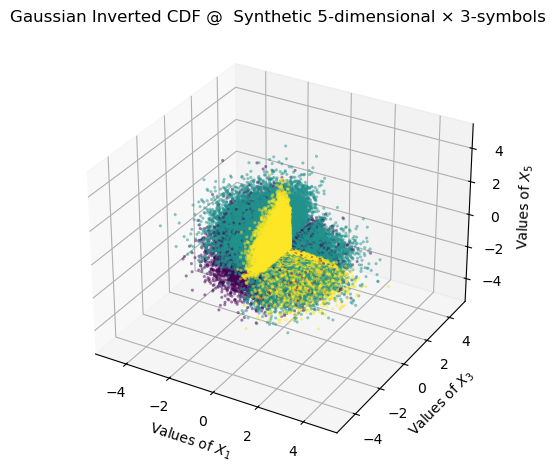

In [90]:
gaussian_cdf_transf = gaussian_cdf(base_task=synthetic_dist_study)
gaussian_x_sample, gaussian_y_sample  = gaussian_cdf_transf.sample(n_samples=n_samples, seed=SEED)


# Plot the 3D figure of the sampled data points
plot_3d_figure(
    X=gaussian_x_sample,                  
    y=gaussian_y_sample,                           
    cell_boundaries=study_scenario['cell_bound'],       
    title=gaussian_cdf_transf.name,  
    savedata=True
)

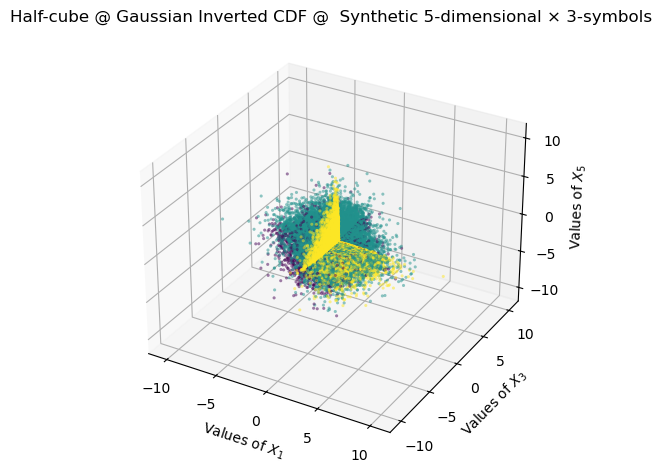

In [91]:
# Apply half-cube mapping
half_cube_map = half_cube(gaussian_cdf_transf)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=study_scenario['cell_bound'], 
   title=half_cube_map.name,
   savedata=True
   )

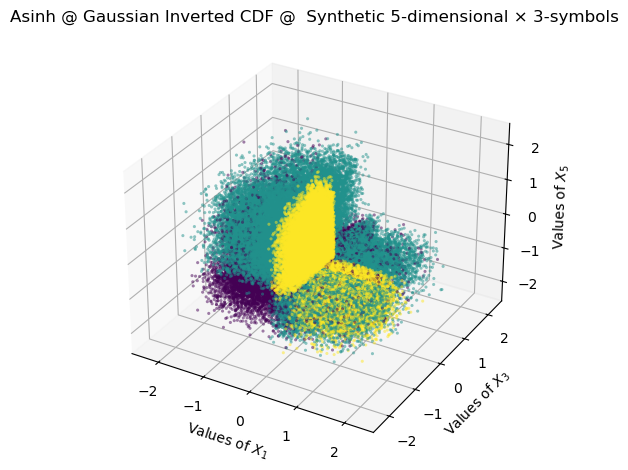

In [92]:
# Apply asinh mapping
asinh_map = asinh(gaussian_cdf_transf)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=study_scenario['cell_bound'], 
   title=asinh_map.name,
   savedata=True
   )

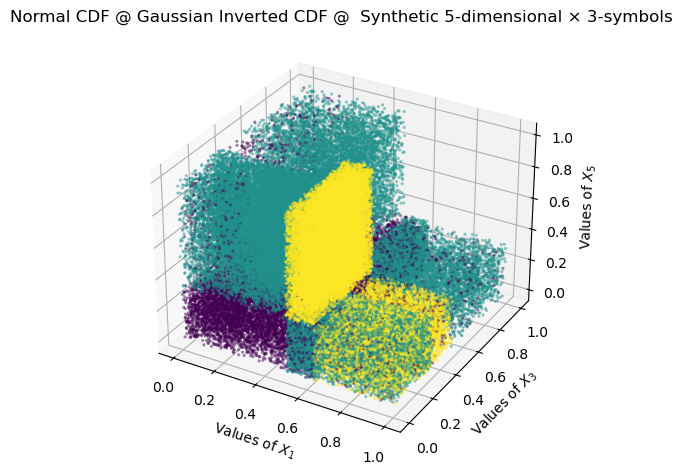

In [93]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(gaussian_cdf_transf)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=study_scenario['cell_bound'], 
   title=uniform_margins_map.name
   )

Dimensiones totales: 10


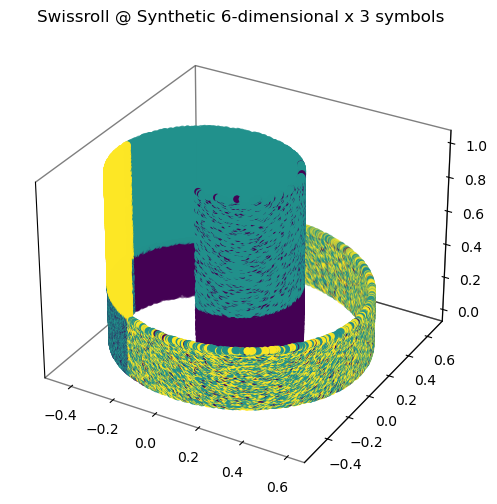

In [94]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Dimensiones totales: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot with dimensions [0, 1]
plot_swissroll(
   distribution=swissroll_emb,
   scenario=study_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )

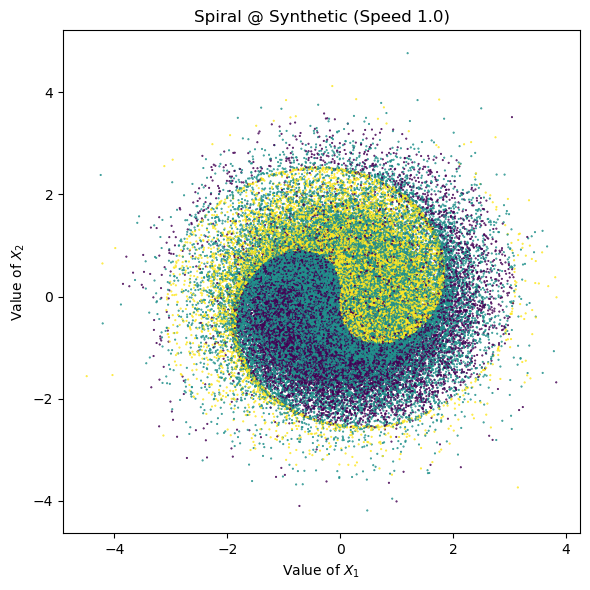

In [95]:
# Generate data for a Swiss roll embedding task
dims = [2, 3]
speed_list = [0.5, 1.0, 1.5]

# Generate spiral data for the given speed
spiral_diff = spiral(base_task=gaussian_cdf_transf, task_name="Spiral @ Synthetic", speed=speed_list[1], x_dim=dims[0], y_dim=dims[1])
x_spiral, y_spiral = spiral_diff.sampler.sample_split(n_points=n_samples, rng=SEED, transformer="spiral", spiral_dims=dims)

plot_spiral(
    X=x_spiral,
    y=y_spiral,
    speed=speed_list[1],
    title=spiral_diff.name)

### t-student transformed

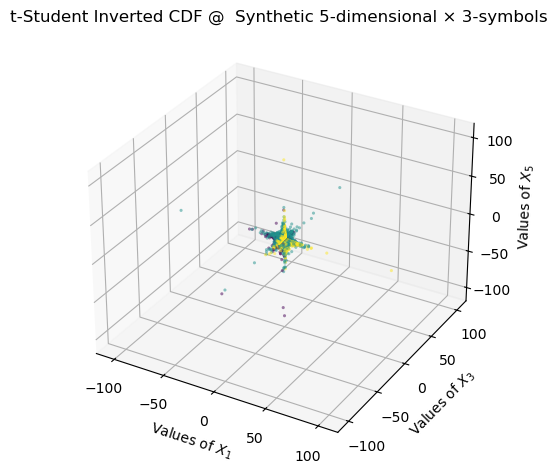

In [96]:
df = 3  # Degrees of freedom 

student_cdf_transf = student_cdf(base_task=synthetic_dist_study, df=df)
student_x_sample, student_y_sample = student_cdf_transf.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
    X=student_x_sample,                  
    y=student_y_sample,                           
    cell_boundaries=study_scenario['cell_bound'],      
    title=student_cdf_transf.name,
    savedata=True  
)

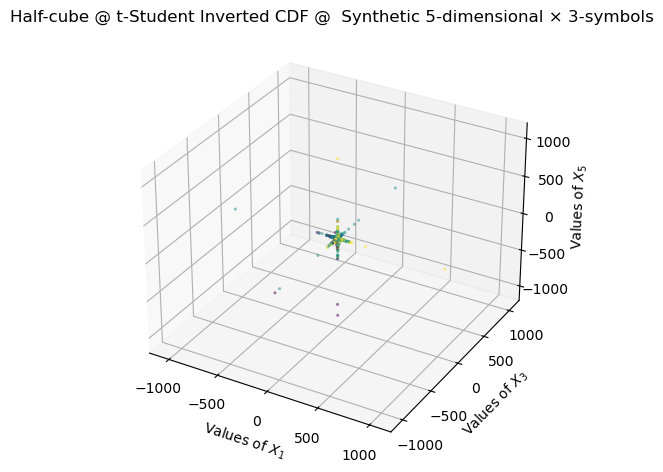

In [97]:
# Apply half-cube mapping
half_cube_map = half_cube(student_cdf_transf)
half_cube_x_sample, half_cube_y_sample = half_cube_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=half_cube_x_sample,
   y=half_cube_y_sample, 
   cell_boundaries=study_scenario['cell_bound'], 
   title=half_cube_map.name,
   savedata=True
   )

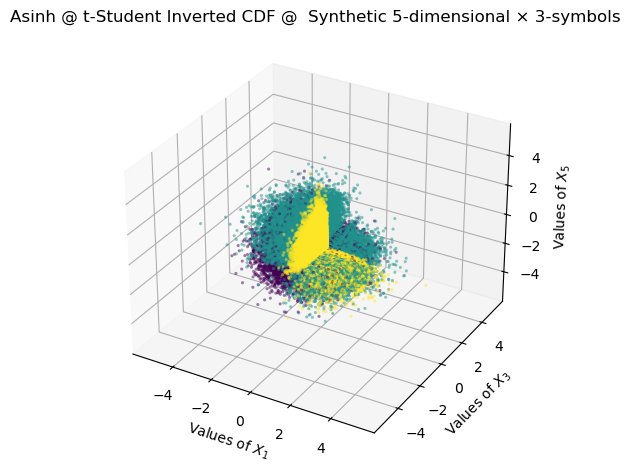

In [98]:
# Apply asinh mapping
asinh_map = asinh(student_cdf_transf)
asinh_x_sample, asinh_y_sample = asinh_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=asinh_x_sample,
   y=asinh_y_sample, 
   cell_boundaries=study_scenario['cell_bound'], 
   title=asinh_map.name,
   savedata=True
   )

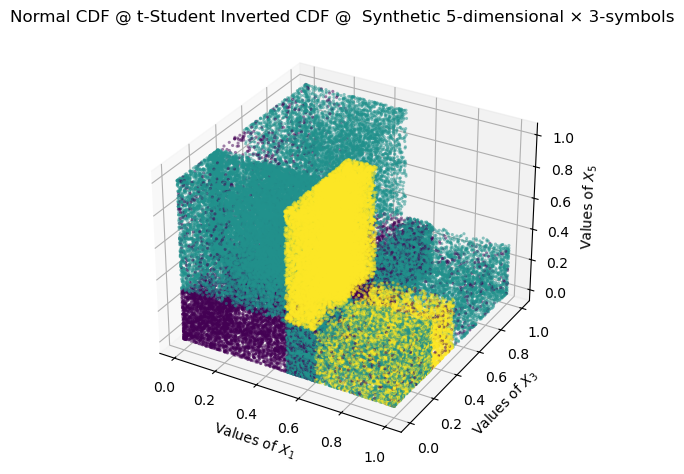

In [99]:
# Apply uniform margins transformation
uniform_margins_map = uniform_margins(student_cdf_transf)
uniform_x_sample, uniform_y_sample = uniform_margins_map.sample(n_samples=n_samples, seed=SEED)

# Plot the 3D figure of the sampled data points
plot_3d_figure(
   X=uniform_x_sample,
   y=uniform_y_sample, 
   cell_boundaries=study_scenario['cell_bound'], 
   title=uniform_margins_map.name
   )

Total dimensions: 10


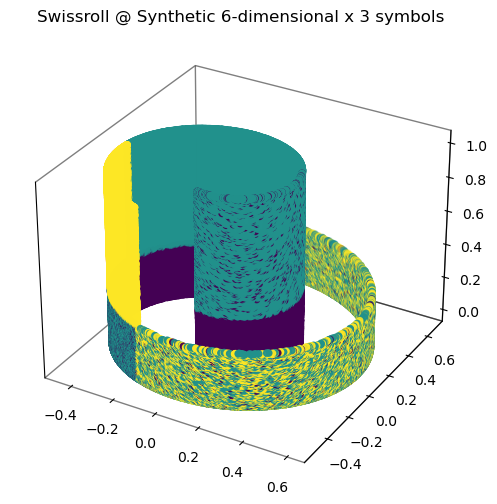

In [100]:
# Generate data for a Swiss roll embedding task
swissroll_emb = swissroll(uniform_margins_map, task_name="Swissroll @ Synthetic")
X_swiss, Y_swiss = swissroll_emb.sample(n_samples=n_samples, seed=SEED)

print(f"Total dimensions: {X_swiss.shape[0]*X_swiss.shape[-1]}")
# Create figure for the 3D plot with dimensions [0, 1]
plot_swissroll(
   distribution=swissroll_emb,
   scenario=study_scenario,
   x_swiss=X_swiss,
   y_swiss=Y_swiss,
   x_sample=uniform_x_sample,
   dim=0
   )